# Parkinson's Disease Prediction using Ensemble Techniques

*   Submitted by: Kovendhan V
*   PGP.AIML.O.JUN20B.Group4



Title: **Parkinsons Disease Data Set**

Abstract: ***Oxford Parkinson's Disease Detection Dataset***

***Source:***

The dataset was created by Max Little of the University of Oxford, in 
collaboration with the National Centre for Voice and Speech, Denver, 
Colorado, who recorded the speech signals. The original study published the 
feature extraction methods for general voice disorders.

**Data Description & Context:**

Parkinson’s Disease (PD) is a degenerative neurological disorder marked by decreased dopamine levels in the brain. It manifests itself through a deterioration of movement, including the presence of tremors and stiffness. There is commonly a marked effect on speech, including dysarthria (difficulty articulating sounds), hypophonia (lowered volume), and monotone (reduced pitch range). Additionally, cognitive impairments and changes in mood can occur, and risk of dementia is increased.

Traditional diagnosis of Parkinson’s Disease involves a clinician taking a neurological history of the patient and observing motor skills in various situations. Since there is no definitive laboratory test to diagnose PD, diagnosis is often difficult, particularly in the early stages when motor effects are not yet severe. Monitoring progression of the disease over time requires repeated clinic visits by the patient. An effective screening process, particularly one that doesn’t require a clinic visit, would be beneficial. Since PD patients exhibit characteristic vocal features, voice recordings are a useful and non-invasive tool for diagnosis. If machine learning algorithms could be applied to a voice recording dataset to accurately diagnosis PD, this would be an effective screening step prior to an appointment with a clinician

**Attribute Information:**

- `name` - ASCII subject name and recording number
- `MDVP:Fo(Hz)` - Average vocal fundamental frequency
- `MDVP:Fhi(Hz)` - Maximum vocal fundamental frequency
- `MDVP:Flo(Hz)` - Minimum vocal fundamental frequency
- `MDVP:Jitter(%)`,`MDVP:Jitter(Abs)`,`MDVP:RAP`,`MDVP:PPQ`,`Jitter:DDP` - Several measures of variation in fundamental frequency
- `MDVP:Shimmer`,`MDVP:Shimmer(dB)`,`Shimmer:APQ3`,`Shimmer:APQ5`,`MDVP:APQ`,`Shimmer:DDA` - Several measures of variation in amplitude
- `NHR`,`HNR` - Two measures of ratio of noise to tonal components in the voice
- `status` - Health status of the subject (one) - Parkinson's, (zero) - healthy
- `RPDE`,`D2` - Two nonlinear dynamical complexity measures
- `DFA` - Signal fractal scaling exponent
- `spread1`,`spread2`,`PPE` - Three nonlinear measures of fundamental - frequency variation

**Objective:**

Goal is to classify the patients into the respective labels using the attributes from their voice recordings.

**Steps and tasks:**
1. Load the dataset
2. It is always a good practice to eye-ball raw data to get a feel of the data in terms of number of records, structure of the file, number of attributes, types of attributes and a general idea of likely challenges in the dataset. Mention a few comments in this regard (5 points)
3. Using univariate & bivariate analysis to check the individual attributes for their basic statistics such as central values, spread, tails, relationships between variables etc. mention your observations (15 points)
4. Split the dataset into training and test set in the ratio of 70:30 (Training:Test) (5 points)
5. Prepare the data for training - Scale the data if necessary, get rid of missing values (if any) etc (5 points)
6. Train at least 3 standard classification algorithms - Logistic Regression, Naive Bayes’, SVM, k-NN etc, and note down their accuracies on the test data (10 points)
7. Train a meta-classifier and note the accuracy on test data (10 points)
8. Train at least one standard Ensemble model - Random forest, Bagging, Boosting etc, and note the accuracy (10 points)
9. Compare all the models (minimum 5) and pick the best one among them (10 points)

## Step 1: Import the necessary Libraries

In [1]:
#Numerical Calculations
import numpy as np 
import pandas as pd
from scipy.stats import norm, shapiro

#Data Visualization
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from sklearn import tree
from sklearn.tree import export_graphviz
from IPython.display import Image

#Data Preprocessing
from sklearn.preprocessing import RobustScaler

#Train and Test preparation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, StratifiedKFold

#Model Building - Classifiers
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

#Model Building - Ensembles
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, StackingClassifier
import xgboost as xgb
from lightgbm import LGBMClassifier, plot_importance

#Model Evaluation
from sklearn.metrics import confusion_matrix, classification_report, roc_curve
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score, log_loss
from sklearn.metrics import plot_roc_curve, plot_confusion_matrix, plot_precision_recall_curve

from sklearn.inspection import plot_partial_dependence

#Misc
import os
import gc
import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Step 2: Load the dataset

Loading the dataset and checking the first 10 records

In [2]:
parkinsons = pd.read_csv("/content/drive/My Drive/Colab Notebooks/Datasets/Data - Parkinsons")
parkinsons.head(10)

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,0.02182,0.03130,0.02971,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,0.03134,0.04518,0.04368,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,0.02757,0.03858,0.03590,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,0.02924,0.04005,0.03772,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,0.03490,0.04825,0.04465,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
5,phon_R01_S01_6,120.552,131.162,113.787,0.00968,0.00008,0.00463,0.00750,0.01388,0.04701,0.456,0.02328,0.03526,0.03243,0.06985,0.01222,21.378,1,0.415564,0.825069,-4.242867,0.299111,2.187560,0.357775
6,phon_R01_S02_1,120.267,137.244,114.820,0.00333,0.00003,0.00155,0.00202,0.00466,0.01608,0.140,0.00779,0.00937,0.01351,0.02337,0.00607,24.886,1,0.596040,0.764112,-5.634322,0.257682,1.854785,0.211756
7,phon_R01_S02_2,107.332,113.840,104.315,0.00290,0.00003,0.00144,0.00182,0.00431,0.01567,0.134,0.00829,0.00946,0.01256,0.02487,0.00344,26.892,1,0.637420,0.763262,-6.167603,0.183721,2.064693,0.163755
8,phon_R01_S02_3,95.730,132.068,91.754,0.00551,0.00006,0.00293,0.00332,0.00880,0.02093,0.191,0.01073,0.01277,0.01717,0.03218,0.01070,21.812,1,0.615551,0.773587,-5.498678,0.327769,2.322511,0.231571
9,phon_R01_S02_4,95.056,120.103,91.226,0.00532,0.00006,0.00268,0.00332,0.00803,0.02838,0.255,0.01441,0.01725,0.02444,0.04324,0.01022,21.862,1,0.547037,0.798463,-5.011879,0.325996,2.432792,0.271362


Checking the Features / Variables

In [3]:
parkinsons.columns

Index(['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')

Checking the shape of the dataset

In [4]:
print('No of Rows : ', parkinsons.shape[0])
print('No of Columns : ', parkinsons.shape[1])

No of Rows :  195
No of Columns :  24


Checking the datatypes and null records

In [5]:
parkinsons.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

Checking total number of Null values in the dataset

In [6]:
parkinsons.isnull().any().sum()

0

**Observations:**
- For each patient total of six records available in the dataset. This might cause 'Sample Bias' in the model. 
- There are no null records.
- However let us check if the values are all numeric.

In [7]:
#Checking if the dataset has only Numeric Data
parkinsons.applymap(np.isreal).all()

name                False
MDVP:Fo(Hz)          True
MDVP:Fhi(Hz)         True
MDVP:Flo(Hz)         True
MDVP:Jitter(%)       True
MDVP:Jitter(Abs)     True
MDVP:RAP             True
MDVP:PPQ             True
Jitter:DDP           True
MDVP:Shimmer         True
MDVP:Shimmer(dB)     True
Shimmer:APQ3         True
Shimmer:APQ5         True
MDVP:APQ             True
Shimmer:DDA          True
NHR                  True
HNR                  True
status               True
RPDE                 True
DFA                  True
spread1              True
spread2              True
D2                   True
PPE                  True
dtype: bool

Re-ordering the target variable 'status' as the last column for our convenience

In [8]:
temp = parkinsons['status']
parkinsons.drop(['status'], axis = 1, inplace=True)
parkinsons['status'] = temp

parkinsons.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE,status
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,0.02182,0.03130,0.02971,0.06545,0.02211,21.033,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654,1
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,0.03134,0.04518,0.04368,0.09403,0.01929,19.085,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674,1
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,0.02757,0.03858,0.03590,0.08270,0.01309,20.651,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634,1
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,0.02924,0.04005,0.03772,0.08771,0.01353,20.644,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975,1
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,0.03490,0.04825,0.04465,0.10470,0.01767,19.649,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335,1


## Step 3: Statistical Summary (Five Number Summary) of the Dataset

In [9]:
parkinsons.describe().T

,count,mean,std,min,25%,50%,75%,max
MDVP:Fo(Hz),195.0,154.228641,41.390065,88.333000,117.572000,148.790000,182.769000,260.105000
MDVP:Fhi(Hz),195.0,197.104918,91.491548,102.145000,134.862500,175.829000,224.205500,592.030000
MDVP:Flo(Hz),195.0,116.324631,43.521413,65.476000,84.291000,104.315000,140.018500,239.170000
MDVP:Jitter(%),195.0,0.006220,0.004848,0.001680,0.003460,0.004940,0.007365,0.033160
MDVP:Jitter(Abs),195.0,0.000044,0.000035,0.000007,0.000020,0.000030,0.000060,0.000260
MDVP:RAP,195.0,0.003306,0.002968,0.000680,0.001660,0.002500,0.003835,0.021440
MDVP:PPQ,195.0,0.003446,0.002759,0.000920,0.001860,0.002690,0.003955,0.019580
Jitter:DDP,195.0,0.009920,0.008903,0.002040,0.004985,0.007490,0.011505,0.064330
MDVP:Shimmer,195.0,0.029709,0.018857,0.009540,0.016505,0.022970,0.037885,0.119080
MDVP:Shimmer(dB),195.0,0.282251,0.194877,0.085000,0.148500,0.221000,0.350000,1.302000


**Observations from the Statistical Summary:**

Scale of all the variables are different, hence it becomes imperative to use Scaler transformation before Model Building.

1. `MDVP:Fo(Hz)` :
  - Min-Max Range of 171.77 and Standard Deviation of 41.39 indicates huge spread and variance in distribution. 
  - Kurtosis value of -0.62 indicates thin tail. 
  - Skewness value of 0.59 indicates Positive Skewness. 
  
2. `MDVP:Fhi(Hz)` :
  - Min-Max Range of 489.89 and Standard Deviation of 91.49 indicates huge spread and variance in distribution. 
  - Kurtosis value of 7.62 indicates thick tail. 
  - Skewness value of 2.542 indicates Positive Skewness in accordance with the thick tail denoted by Kurtosis. 

3. `MDVP:Flo(Hz)` :
  - Min-Max Range of 173.69 and Standard Deviation of 43.52 indicates huge spread and variance in distribution. 
  - Kurtosis value of 0.654 indicates presence of tail. 
  - Skewness value of 1.217 indicates Strong Positive Skewness with a long tail. 

4. `MDVP:Jitter(%)` :
  - Min-Max Range of 0.031480 and Standard Deviation of 0.004848 indicates wide spread and variance in distribution. 
  - Kurtosis value of 12.03 indicates very strong tail. 
  - Skewness value of 3.085 indicates Positive Skewness. 

5. `MDVP:Jitter(Abs)` :
  - Min-Max Range of 0.000253 and Standard Deviation of 0.000035 indicates wide spread and variance in distribution. 
  - Kurtosis value of 10.86 indicates very strong tail. 
  - Skewness value of 2.649 indicates Positive Skewness with data spread on the long tail. 

6. `MDVP:RAP` :
  - Min-Max Range of 0.02076 and Standard Deviation of 0.00296 indicates fair spread of data and variance in distribution. 
  - Kurtosis value of 14.213 indicates very strong tail. 
  - Skewness value of 3.360 indicates Positive Skewness with data distributed among the long tail. 

7. `MDVP:PPQ` :
  - Min-Max Range of 0.0186 and Standard Deviation of 0.00275 indicates wide spread and variance in distribution. 
  - Kurtosis value of 11.9639 indicates very strong tail. 
  - Skewness value of 3.0738 indicates Strong Positive Skewness with data spread on the long tail. 
 
8. `Jitter:DDP` :
  - Min-Max Range of 0.0622 and Standard Deviation of 0.0089 indicates wide spread and variance in distribution. 
  - Kurtosis value of 14.2247 indicates very strong tail. 
  - Skewness value of 3.3620 indicates Strong Positive Skewness with data spread on the long tail. 

9. `MDVP:Shimmer` :
  - Min-Max Range of 0.1095 and Standard Deviation of 0.0188 indicates wide spread and variance in distribution. 
  - Kurtosis value of 3.2383 indicates very strong tail. 
  - Skewness value of 1.6664 indicates Positive Skewness with data spread on the long tail. 

10. `MDVP:Shimmer(dB)` :
  - Min-Max Range of 1.2170 and Standard Deviation of 0.1948 indicates wide spread and variance in distribution. 
  - Kurtosis value of 5.1281 indicates strong tail. 
  - Skewness value of 1.9993 indicates Strong Positive Skewness with data spread on the tail. 

11. `Shimmer:APQ3` :
  - Min-Max Range of 0.0519 and Standard Deviation of 0.0101 indicates wide spread and variance in distribution. 
  - Kurtosis value of 2.7201 indicates fair tail. 
  - Skewness value of 1.5805 indicates Positive Skewness with data spread on the tail. 

12. `Shimmer:APQ5` :
  - Min-Max Range of 0.0737 and Standard Deviation of 0.0120 indicates wide spread and variance in distribution. 
  - Kurtosis value of 3.8742 indicates fair tail. 
  - Skewness value of 1.7986 indicates Positive Skewness with data spread on the tail. 

13. `MDVP:APQ` :
  - Min-Max Range of 0.1305 and Standard Deviation of 0.0169 indicates wide spread and variance in distribution. 
  - Kurtosis value of 11.1632 indicates very strong tail. 
  - Skewness value of 2.6180 indicates Strong Positive Skewness with data spread on the long tail. 

14. `Shimmer:DDA` :
  - Min-Max Range of 0.1557 and Standard Deviation of 0.0304 indicates wide spread and variance in distribution. 
  - Kurtosis value of 2.7206 indicates fair tail. 
  - Skewness value of 1.5806 indicates Positive Skewness with data spread on the tail. 

15. `NHR` :
  - Min-Max Range of 0.3141 and Standard Deviation of 0.0404 indicates wide spread and variance in distribution. 
  - Kurtosis value of 21.9949 indicates very strong tail. 
  - Skewness value of 4.2207 indicates Strong Positive Skewness with data spread on the long tail. 

16. `HNR` :
  - Min-Max Range of 24.606 and Standard Deviation of 4.4257 indicates wide spread and variance in distribution. 
  - Kurtosis value of 0.6160 indicates thin tail. 
  - Skewness value of -0.5143 indicates Slight Negative Skewness. 

17. `RPDE` :
  - Min-Max Range of 0.4285 and Standard Deviation of 0.1039 indicates wide spread and variance in distribution. 
  - Kurtosis value of -0.9217 indicates thin tail. 
  - Skewness value of -0.1434 indicates Slight Negative Skewness. 

18. `DFA` :
  - Min-Max Range of 0.2510 and Standard Deviation of 0.05533 indicates wide spread and variance in distribution. 
  - Kurtosis value of -0.68615 indicates thin tail. 
  - Skewness value of -0.03321 indicates Slight Negative Skewness. 

19. `spread1` :
  - Min-Max Range of 5.5309 and Standard Deviation of 1.0902 indicates wide spread and variance in distribution. 
  - Kurtosis value of 0.05019 indicates thin tail. 
  - Skewness value of 0.4321 indicates Slight Positive Skewness. 

20. `spread2` :
  - Min-Max Range of 0.4442 and Standard Deviation of 0.0834 indicates huge spread and variance in distribution. 
  - Kurtosis value of -0.08302 indicates thin tail. 
  - Skewness value of 0.1444 indicates Slight Positive Skewness. 

21. `D2` :
  - Min-Max Range of 2.2478 and Standard Deviation of 0.3827 indicates huge spread and variance in distribution. 
  - Kurtosis value of 0.2203 indicates presence of tail. 
  - Skewness value of 0.4303 indicates Positive Skewness, but the Skewness is minimal. 

22. `PPE` :
  - Min-Max Range of 0.48282 and Standard Deviation of 0.09011 indicates wide spread and variance in distribution. 
  - Kurtosis value of 0.5283 indicates presence of tail. 
  - Skewness value of 0.7974 indicates Positive Skewness. 


## Step 4: Exploratory Data Analysis (Univariate & Multivariate)

Dropping `name` from the dataframe.

In [10]:
parkinsons = parkinsons.drop(columns='name')
parkinsons.head()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE,status
0,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,0.02182,0.03130,0.02971,0.06545,0.02211,21.033,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654,1
1,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,0.03134,0.04518,0.04368,0.09403,0.01929,19.085,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674,1
2,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,0.02757,0.03858,0.03590,0.08270,0.01309,20.651,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634,1
3,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,0.02924,0.04005,0.03772,0.08771,0.01353,20.644,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975,1
4,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,0.03490,0.04825,0.04465,0.10470,0.01767,19.649,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335,1


#### Univariate Analysis

In [11]:
#Segregating the Numeric Predictors for plotting
num_cols = ['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE']

In [12]:
    def plot_univariate_features(df):
        """
        Helper function to plot Univariate features.
        Input : Dataframe; Output : All Univariate plots for both Numeric and Categorical variables. 
        """
        print("Integer Columns = ",df.select_dtypes(include=['int32','int64']).columns)
        print("Floating Point Columns = ",df.select_dtypes(include=['float64']).columns)
        print("Object Columns = ",df.select_dtypes(include=['object']).columns)
        print("Category Columns = ",df.select_dtypes(include=['category']).columns)
        
        #sns.set_style(style='darkgrid')
        int_cols = pd.Series(df.select_dtypes(include=['int32','int64']).columns)
        for j in range(0,len(int_cols)):
            f, axes = plt.subplots(1, 2, figsize=(10, 10))
            sns.boxplot(df[int_cols[j]], ax = axes[0], palette='Greens_r')
            sns.distplot(df[int_cols[j]], ax = axes[1], fit=norm)
            plt.subplots_adjust(top =  1.5, right = 10, left = 8, bottom = 1)

        float_cols = pd.Series(df.select_dtypes(include=['float64']).columns)
        for j in range(0,len(float_cols)):
            plt.Text('Figure for float64')
            f, axes = plt.subplots(1, 2, figsize=(10, 10))
            sns.boxplot(df[float_cols[j]], ax = axes[0], palette='Greens_r')
            sns.distplot(df[float_cols[j]], ax = axes[1], fit=norm)
            plt.subplots_adjust(top =  1.5, right = 10, left = 8, bottom = 1)

        obj_cols = pd.Series(df.select_dtypes(include=['object']).columns)
        for j in range(0,len(obj_cols)):
            plt.subplots()
            sns.countplot(df[obj_cols[j]])

Integer Columns =  Index([], dtype='object')
Floating Point Columns =  Index(['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'spread1',
       'spread2', 'D2', 'PPE'],
      dtype='object')
Object Columns =  Index([], dtype='object')
Category Columns =  Index([], dtype='object')


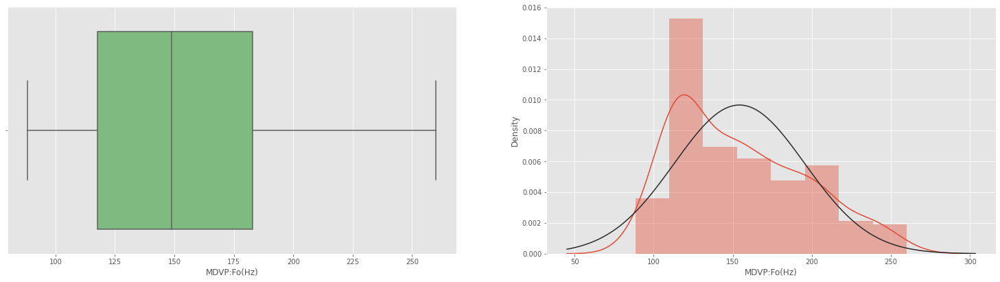

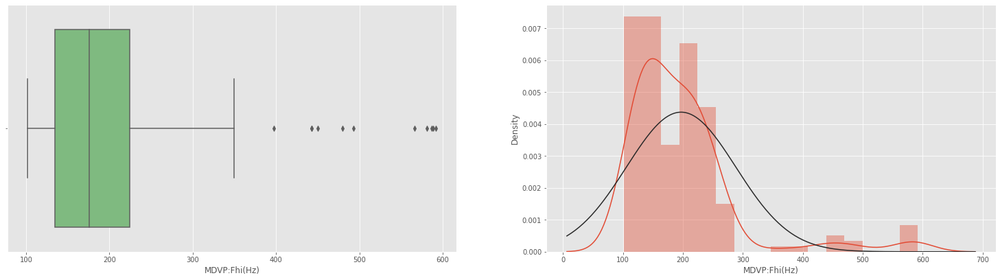

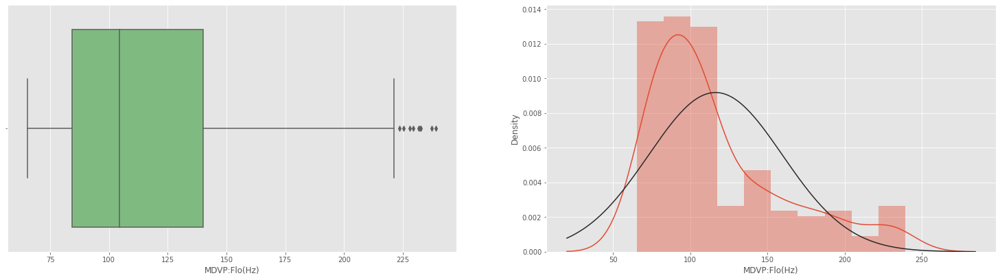

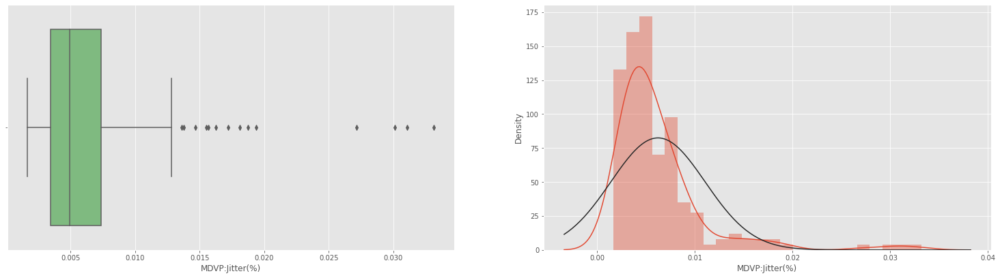

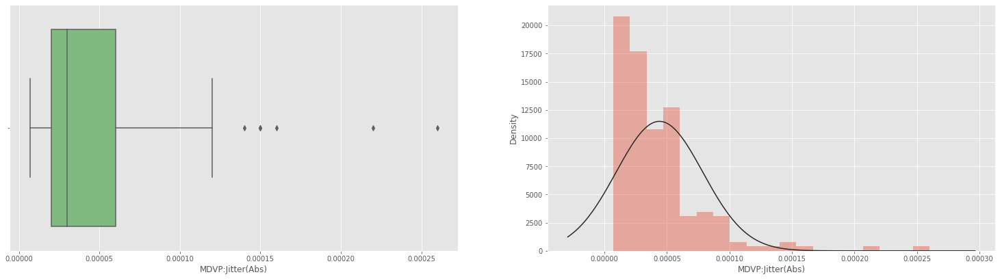

...

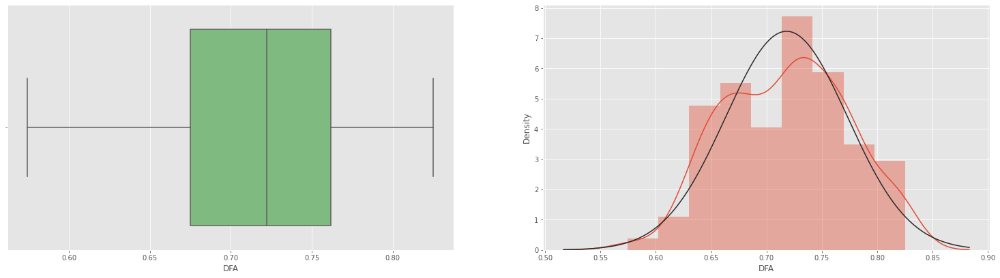

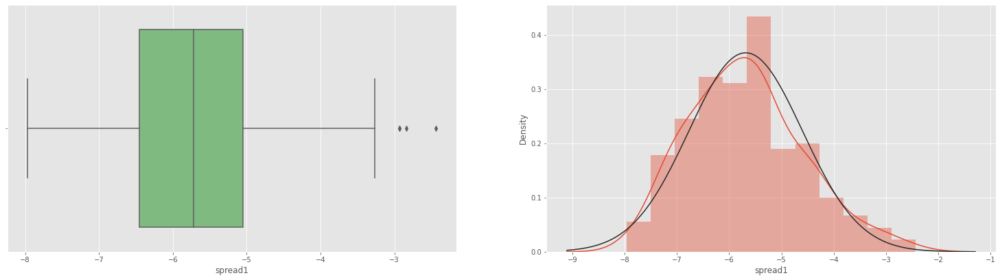

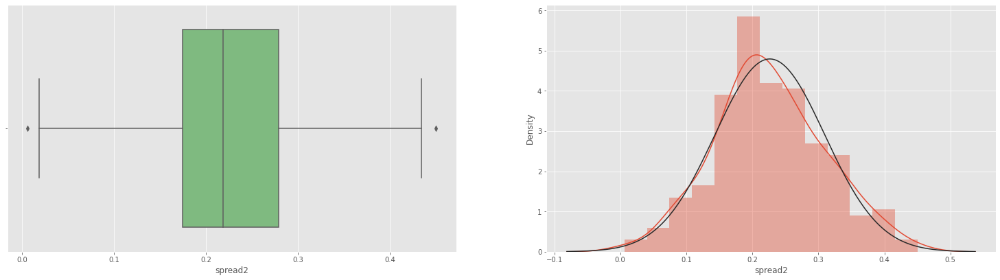

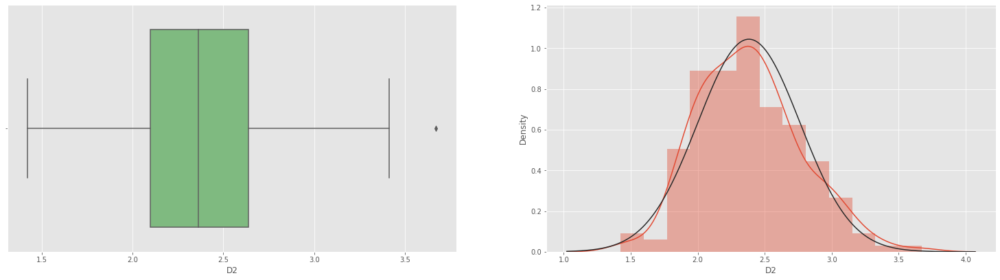

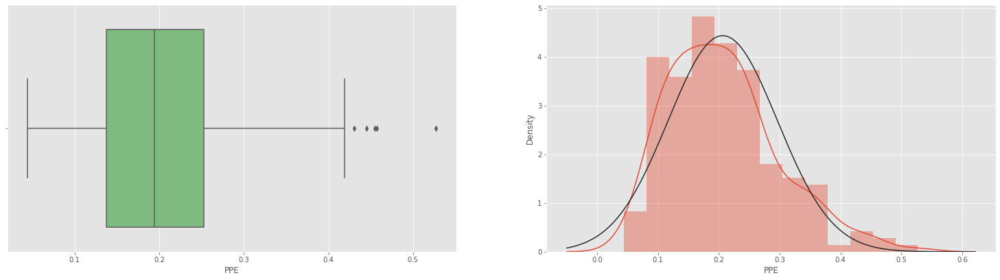

In [13]:
plot_univariate_features(parkinsons[num_cols])

#f = pd.melt(parkinsons, value_vars=cols)
#g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, height=4, aspect=2)
#g = g.map(sns.distplot, "value")

***List of features with Multiple Gausssian Mixtures:***
(Multimodal Distributions)
- `MDVP:Fhi(Hz)`
- `MDVP:RAP`
- `MDVP:PPQ`
- `Shimmer:APQ5`
- `HNR`
- `RPDE`
- `DFA`

#### Shapiro Test for Normality check

In [14]:
normality_test = lambda x: shapiro(x.fillna(0))[1] < 0.01
normal = parkinsons[num_cols]
normal = normal.apply(normality_test)
print(~normal)

MDVP:Fo(Hz)         False
MDVP:Fhi(Hz)        False
MDVP:Flo(Hz)        False
MDVP:Jitter(%)      False
MDVP:Jitter(Abs)    False
MDVP:RAP            False
MDVP:PPQ            False
Jitter:DDP          False
MDVP:Shimmer        False
MDVP:Shimmer(dB)    False
Shimmer:APQ3        False
Shimmer:APQ5        False
MDVP:APQ            False
Shimmer:DDA         False
NHR                 False
HNR                 False
RPDE                False
DFA                  True
spread1              True
spread2              True
D2                   True
PPE                 False
dtype: bool


In [15]:
non_normal_cols = ['MDVP:Fo(Hz)','MDVP:Fhi(Hz)','MDVP:Flo(Hz)','MDVP:Jitter(%)',
                   'MDVP:Jitter(Abs)','MDVP:RAP','MDVP:PPQ','Jitter:DDP','MDVP:Shimmer',
                   'MDVP:Shimmer(dB)','Shimmer:APQ3','Shimmer:APQ5','MDVP:APQ','Shimmer:DDA','NHR','HNR','RPDE','PPE']
non_normal_cols

['MDVP:Fo(Hz)',
 'MDVP:Fhi(Hz)',
 'MDVP:Flo(Hz)',
 'MDVP:Jitter(%)',
 'MDVP:Jitter(Abs)',
 'MDVP:RAP',
 'MDVP:PPQ',
 'Jitter:DDP',
 'MDVP:Shimmer',
 'MDVP:Shimmer(dB)',
 'Shimmer:APQ3',
 'Shimmer:APQ5',
 'MDVP:APQ',
 'Shimmer:DDA',
 'NHR',
 'HNR',
 'RPDE',
 'PPE']

#### Skewness Check

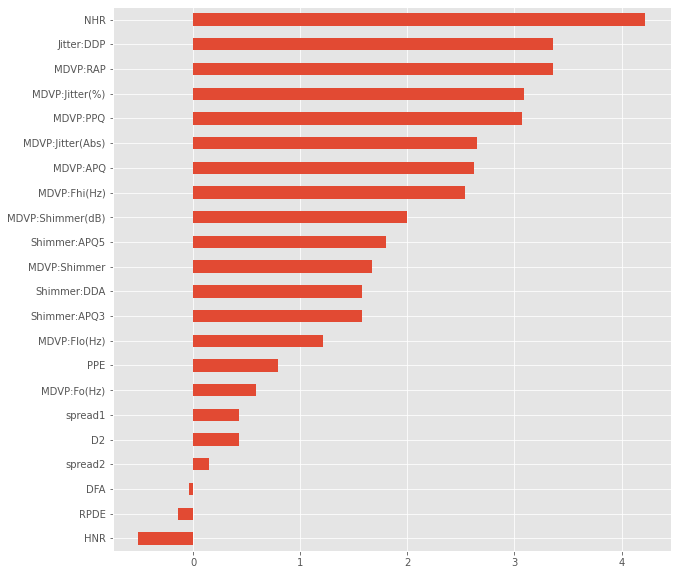

In [16]:
plt.figure(figsize=(10,10))
parkinsons[num_cols].skew().sort_values().plot(kind='barh')
plt.show()

#### Outliers Detection and Treatment

In [17]:
def outliers_IQR(df):
  """
  Helper function to detect Outliers in the Dataframe
  Input : Dataframe; Output : Dataframe containing Percentage and Number of Outliers. 
  """
  columns = df.columns
  outliers_list = []
  no_of_outliers = []
  for c in df.columns:
    Q1 = df[c].quantile(0.25)
    Q3 = df[c].quantile(0.75)
    IQR = Q3 - Q1
    df_outliers = np.where((df[c] < (Q1 - 1.5 * IQR)) | (df[c] > (Q3 + 1.5 * IQR)))
    no_of_outliers.append(len(df_outliers[0]))
    outliers_list.append(round((len(df_outliers[0]) / len(df[c]) * 100),2))

  print("\n")
  outliers_df = pd.DataFrame({"Percentage_of_Outliers":outliers_list, "No_of_Outliers":no_of_outliers}, index=df.columns)
  return outliers_df.sort_values(by="Percentage_of_Outliers", ascending=False)

In [18]:
outliers_IQR(parkinsons[non_normal_cols])

,Percentage_of_Outliers,No_of_Outliers
NHR,9.74,19
MDVP:PPQ,7.69,15
MDVP:Jitter(%),7.18,14
MDVP:RAP,7.18,14
Jitter:DDP,7.18,14
Shimmer:APQ5,6.67,13
MDVP:APQ,6.15,12
MDVP:Fhi(Hz),5.64,11
MDVP:Shimmer(dB),5.13,10
MDVP:Flo(Hz),4.62,9


Imputing the Outliers

In [19]:
# Removing outliers (data points beyond 1.5xIQR)

for col in non_normal_cols:
    Q1 = parkinsons[col].quantile(0.25)
    Q3 = parkinsons[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_lim = Q1 - 1.5*IQR
    upper_lim = Q3 + 1.5*IQR
    parkinsons.loc[(parkinsons[col] > upper_lim), col] = np.nan
    parkinsons.loc[(parkinsons[col] < lower_lim), col] = np.nan

print('Outliers are set to NaN')
print('Number of rows impacted due to Outlier treatment : ', parkinsons.isnull().any().sum())

Outliers are set to NaN
Number of rows impacted due to Outlier treatment :  16


In [20]:
#Imputing the Outlier NaNs with Median values

parkinsons[non_normal_cols] = parkinsons[non_normal_cols].apply(lambda x: x.fillna(x.median()),axis=0)
parkinsons.sample(3)

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE,status
177,151.737,190.204,129.859,0.00314,0.00002,0.00135,0.00162,0.00406,0.01469,0.132,0.00728,0.00886,0.01230,0.02184,0.00570,24.151,0.396610,0.745957,-6.486822,0.197919,2.449763,0.132703,1
170,244.990,272.210,101.447,0.00451,0.00002,0.00279,0.00237,0.00837,0.01897,0.181,0.01084,0.01121,0.01255,0.03253,0.01049,21.528,0.522812,0.646818,-7.304500,0.171088,2.095237,0.096220,0
165,236.200,244.663,102.137,0.00277,0.00001,0.00154,0.00153,0.00462,0.02448,0.217,0.01410,0.01426,0.01621,0.04231,0.00620,24.078,0.469928,0.628232,-6.816086,0.172270,2.235197,0.119652,0


In [21]:
parkinsons.isnull().any().sum() #Sanity check post imputation

0

#### Visualising the Target variable `status`

In [22]:
parkinsons['status'].value_counts()

1    147
0     48
Name: status, dtype: int64

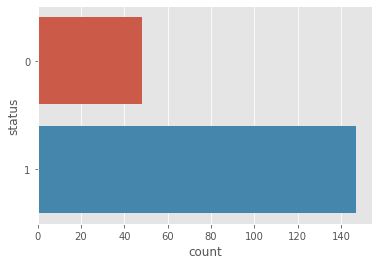

In [23]:
sns.countplot(y='status', data=parkinsons);

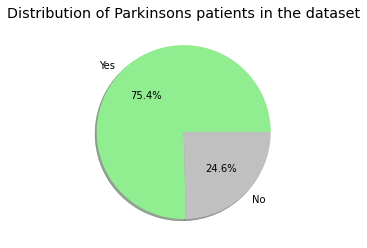

In [24]:
colors = ["lightgreen", "silver"]
labels = ['Yes', 'No']
plt.pie(parkinsons['status'].value_counts(), labels = labels, colors = colors, autopct='%1.1f%%', shadow=True)
plt.title("Distribution of Parkinsons patients in the dataset")
plt.show()

- Around 3/4th of the records are diagnosed with Parkinsons. This is mainly because every patient has 6 records in the given dataset, which is inducing ***'Sample Bias'***. 

- However, since the objective of this dataset is to identify Parkinson's in early stages, we are interested in the True Positive Rate more than the Negative Records (which will not be as costly as misclassifying a Parkinson's patient as healthy).

- Hence, we will not do any resampling for the Class Imbalance and will be looking at additional metrics such as ROC AUC, F1-Score, Recall etc in addition to the Accuracy.

#### Multivariate Analysis

In [25]:
def plot_predictor_target_features(df):
  """
  Helper function to plot multivariate features.
  Input : Dataframe; Output : One-to-Many Multivariate plots for Predictors vs Target feature. 
  """
  print("All Columns = ",df.columns)
  predictor_cols = pd.Series(df.columns)
  for j in range(0,len(predictor_cols)):
    f, axes = plt.subplots(1, 2, figsize=(10, 10))
    sns.boxplot(y=df[predictor_cols[j]], x=parkinsons['status'], ax = axes[0], palette='Accent')
    sns.swarmplot(y=df[predictor_cols[j]], x=parkinsons['status'], ax = axes[0], palette='Dark2')
    sns.violinplot(y=df[predictor_cols[j]], x=parkinsons['status'], ax = axes[1], palette='YlGn')
    plt.subplots_adjust(top =  1.5, right = 10, left = 8, bottom = 1)

All Columns =  Index(['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'spread1',
       'spread2', 'D2', 'PPE'],
      dtype='object')


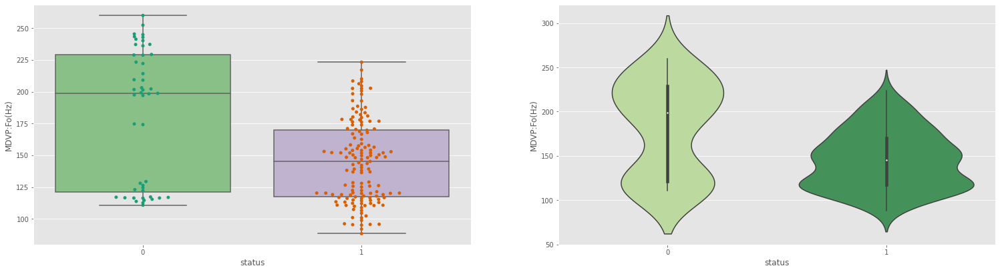

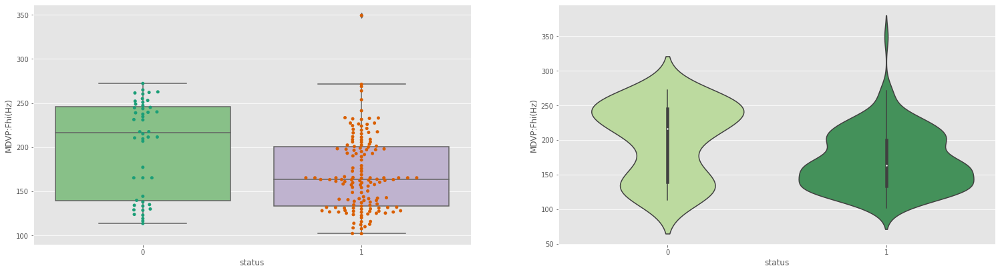

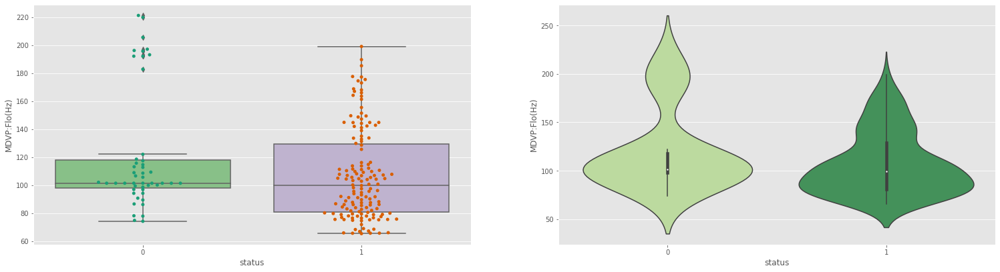

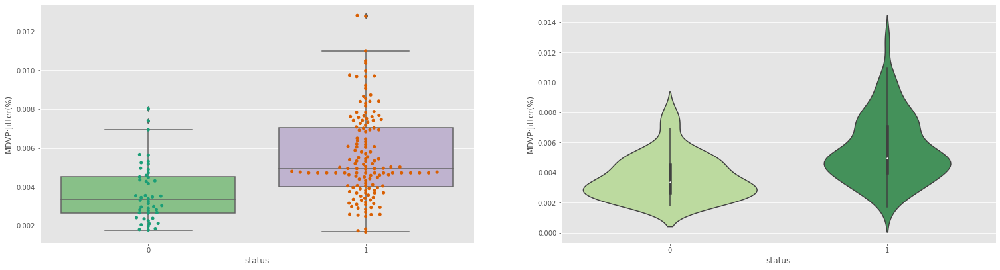

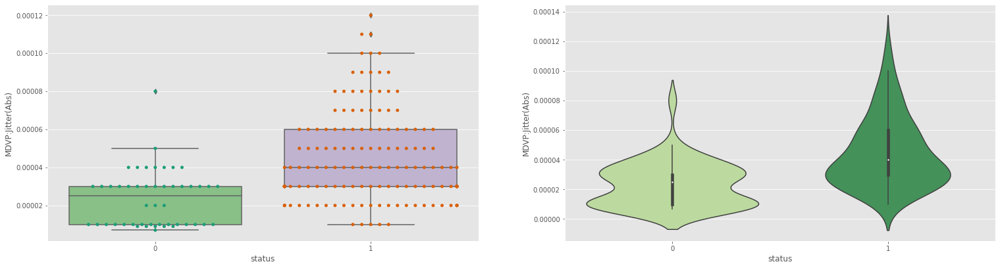

...

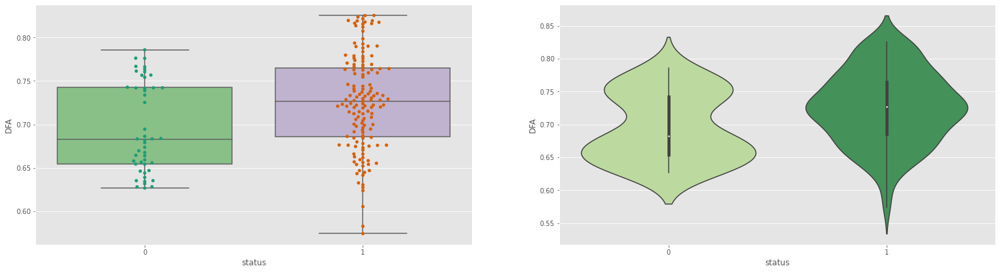

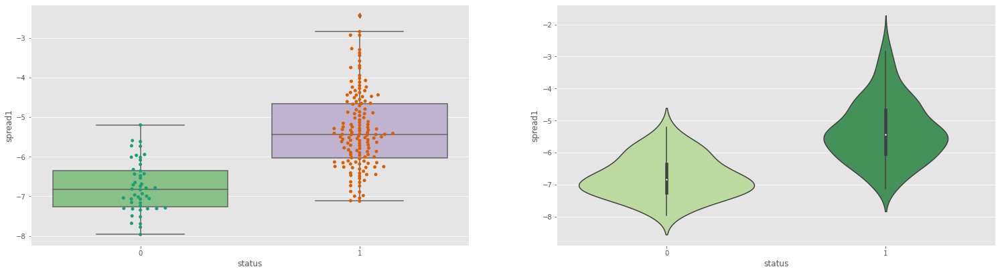

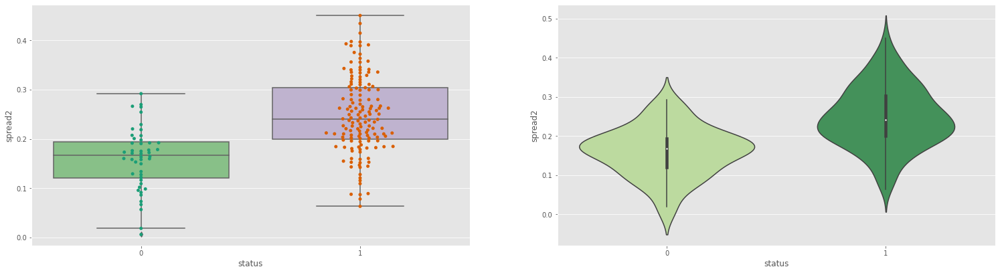

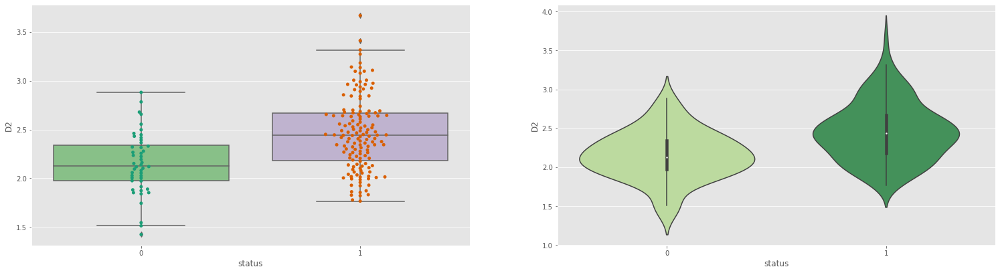

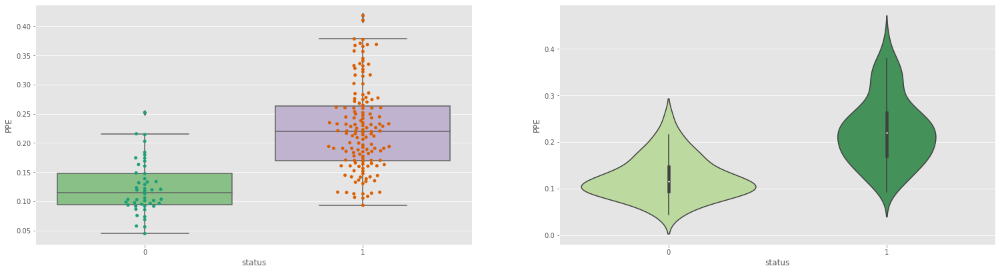

In [26]:
plot_predictor_target_features(parkinsons[num_cols])

#### Pairplot of all variables in the dataset

<Figure size 1440x1440 with 0 Axes>

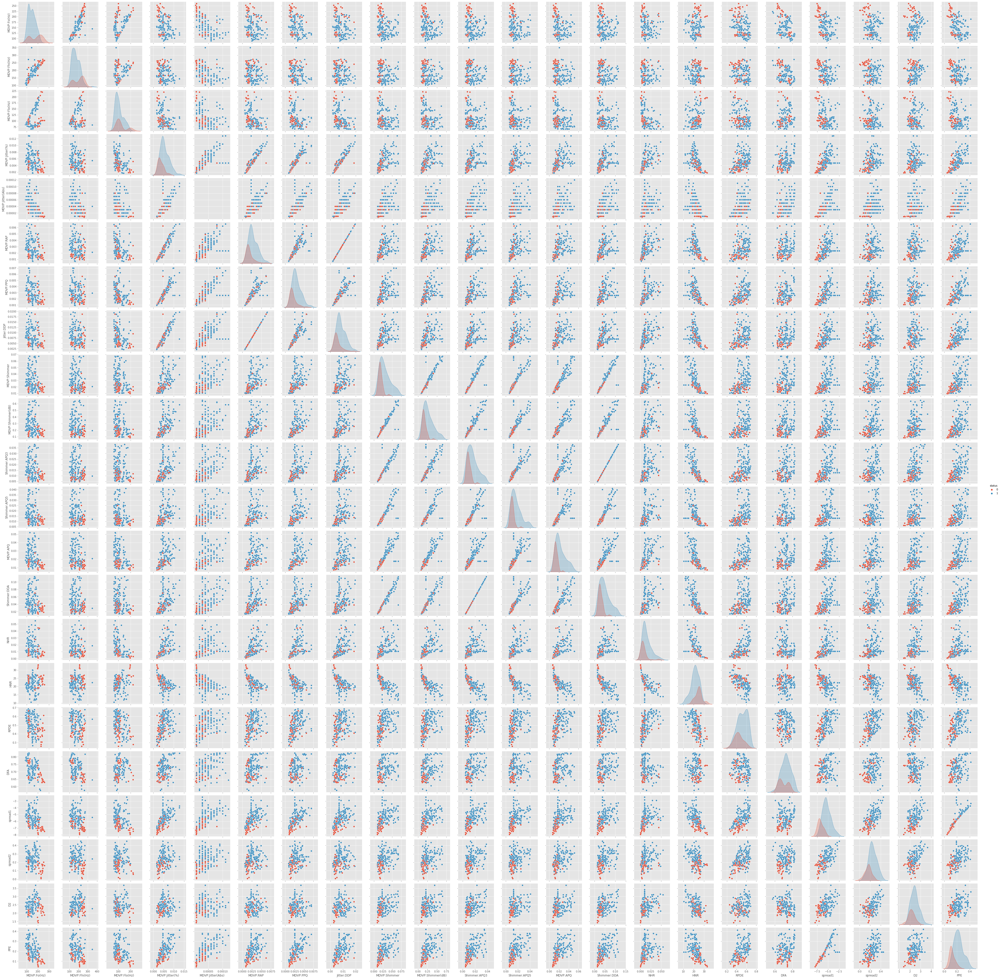

In [27]:
plt.figure(figsize=(20,20))
sns.pairplot(parkinsons, hue='status', diag_kind = 'kde')
plt.show()

#### Correlation Matrix

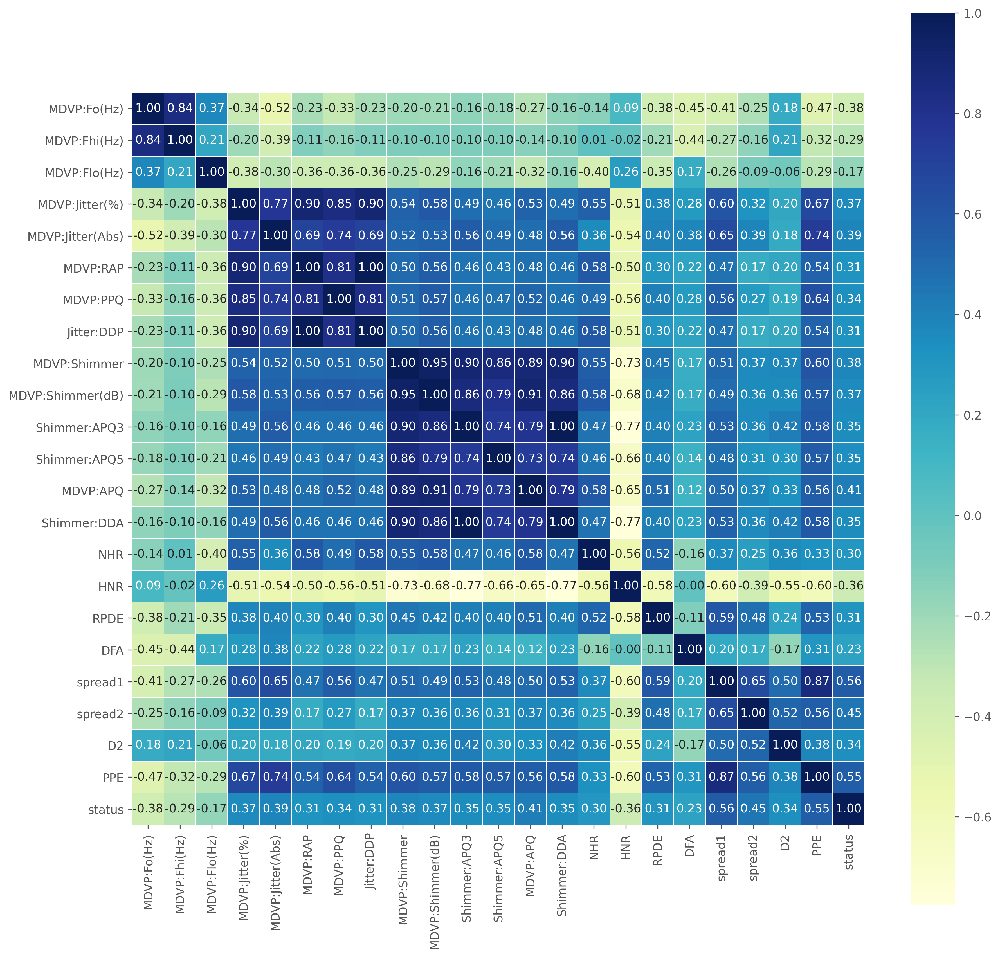

In [28]:
plt.figure(figsize=(14,14), dpi=300)
sns.heatmap(parkinsons.corr(), annot=True, linewidths = 0.3, fmt = '0.2f', cmap = 'YlGnBu', square=True)
plt.show()

#### Highly correlated features with target variable `status`

<Figure size 1080x1080 with 0 Axes>

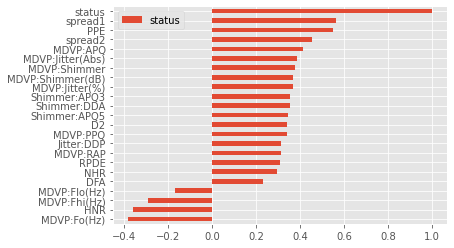

In [29]:
plt.figure(figsize=(15,15))
parkinsons.corr()[['status']].sort_values(by='status', ascending=True).plot(kind='barh')
plt.show()

#### Highly correlated Independent variables

In [30]:
#Identifying highly correlated Independent variables (Predictors)
high_corr_var = parkinsons.corr().abs().unstack() #abs() considers absolute values of correlation coefficients.
high_corr_var = high_corr_var.sort_values(kind = "quicksort", ascending = False)
print('No of highly correlated instances : ',len(high_corr_var[(high_corr_var > 0.8) & (high_corr_var < 1)])) 
print("\n")
print("Percentage of multicollinear variables : ", (len(high_corr_var[(high_corr_var > 0.8) & (high_corr_var < 1)]) / len(parkinsons) * 100))
print("\n")
print(high_corr_var[(high_corr_var > 0.8) & (high_corr_var < 1)])


No of highly correlated instances :  34


Percentage of multicollinear variables :  17.435897435897434


Shimmer:APQ3      Shimmer:DDA         1.000000
Shimmer:DDA       Shimmer:APQ3        1.000000
Jitter:DDP        MDVP:RAP            0.999998
MDVP:RAP          Jitter:DDP          0.999998
MDVP:Shimmer(dB)  MDVP:Shimmer        0.949307
MDVP:Shimmer      MDVP:Shimmer(dB)    0.949307
MDVP:Shimmer(dB)  MDVP:APQ            0.910001
MDVP:APQ          MDVP:Shimmer(dB)    0.910001
MDVP:Jitter(%)    Jitter:DDP          0.901901
Jitter:DDP        MDVP:Jitter(%)      0.901901
MDVP:RAP          MDVP:Jitter(%)      0.901891
MDVP:Jitter(%)    MDVP:RAP            0.901891
MDVP:Shimmer      Shimmer:APQ3        0.896934
Shimmer:APQ3      MDVP:Shimmer        0.896934
Shimmer:DDA       MDVP:Shimmer        0.896932
MDVP:Shimmer      Shimmer:DDA         0.896932
                  MDVP:APQ            0.886286
MDVP:APQ          MDVP:Shimmer        0.886286
PPE               spread1             0.865372
sp

#### Observations from the Multivariate Analysis & Correlation Matrix:
- `MDVP:Fhi(Hz)`, `DFA`, `MDVP:Fo(Hz)`, `MDVP:Flo(Hz)`, `RPDE`, `spread2`, `D2` have weak correlation with other predictors. 
- `PPE`, `spread1`, `MDVP:APQ`, `MDVP:Shimmer`, `MDVP:Shimmer(dB)`, `Shimmer:APQ5`, `MDVP:PPQ`, `Jitter:DDP`, `MDVP:RAP`, `MDVP:Jitter(Abs)`, `Shimmer:APQ3`, `MDVP:Jitter(%)`, `Shimmer:DDA`, `NHR` exhibit multicollinearity, which will be further checked by Variance Inflation Factor (VIF) in the next section. 
- `HNR` exhibits negative correlation with the target variable `status`.

#### Detecting Multicollinear features using Variance Inflation Factor (VIF)

In [31]:
def calculate_vif(X):
    vif_features = pd.DataFrame()
    vif_features["Features"] = X.columns
    vif_features["VIF Score"] = [vif(X.values, i) for i in range(X.shape[1])]
    return(vif_features)

In [32]:
vif_df = calculate_vif(parkinsons[num_cols])
vif_df.sort_values(by='VIF Score', ascending=False)

,Features,VIF Score
13,Shimmer:DDA,4.316793e+07
10,Shimmer:APQ3,4.316600e+07
7,Jitter:DDP,1.363091e+06
5,MDVP:RAP,1.362192e+06
17,DFA,2.960254e+02
18,spread1,1.335125e+02
15,HNR,1.099105e+02
8,MDVP:Shimmer,1.044914e+02
0,MDVP:Fo(Hz),9.528974e+01
20,D2,7.857121e+01


In [33]:
vif_df[vif_df['VIF Score']<10].sort_values(by='VIF Score', ascending=False)

,Features,VIF Score
14,NHR,7.376751


## Step 5: Split the data into Train and Test set

#### Separating the Predictors and Target variables in X & y

In [34]:
X = parkinsons[num_cols]
y = parkinsons['status']

#### Split the Train and Test set

In [35]:
#Stratify is used to preserve proportion of target classes in splits, since the Class is Imbalanced
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state = 24)

#### View the shapes of Train and Test sets

In [36]:
display(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(136, 22)

(59, 22)

(136,)

(59,)

## Step 6: Data Preprocessing

#### Scaling the data using RobustScaler

In [37]:
#Outliers in our dataset will be better handled by RobustScaler() 
scaler = RobustScaler()
#Fitting the Training set
scaler.fit(X_train)

RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
             with_scaling=True)

Note: Fit using X_train and transform both X_train and X_test. It is better to construct Pipelines for such Preprocessing steps, though it is out of scope of this current assignment.

In [38]:
scaler.transform(X_train)
scaler.transform(X_test)

array([[ 0.89604668,  0.59430698,  2.74207723, ..., -0.41476967,
        -1.40834924, -1.16556799],
       [ 0.66918806,  0.65468812,  1.85042616, ...,  1.03871999,
         1.66605454,  1.87084331],
       [ 0.90500731,  0.85012354, -0.43626302, ..., -0.09209843,
         0.23725644, -0.05244752],
       ...,
       [-0.32296515,  0.        , -0.37837179, ...,  0.52501159,
         0.62015675, -0.35904964],
       [-0.54839407, -0.54307683,  0.20607442, ..., -0.23497544,
        -0.64386347, -0.09403531],
       [ 0.00703219, -0.09002548,  1.07647864, ..., -0.37844564,
        -0.15221644, -0.293062  ]])

Note: 
- RobustScaler() is used instead of StandardScaler() or MinMaxScaler() since RobustScaler can handle Outliers present in the data to a better extent. 
- Scaling and Centering the data is a must for Gaussian algorithms such as 'Support Vector Machines' with Radial Basis Kernel and distance-based algorithms such as K-Nearest Neighbors. 
- However, the scaling is not a must for Non-parametric methods such as Trees. 

## Step 7: Model Building - Training Classifiers

In [39]:
def classifier_metrics(classifier):
  """
  Helper function to plot Univariate features.
  Input  : Classifier; 
  Output : Accuracy, Classification Report, Confusion Matrix, ROC AUC Curve, Precision-Recall Curve 
  """
  y_true, y_pred = y_test, classifier.predict(X_test)
  train_accuracy = classifier.score(X_train, y_train).round(3)
  test_accuracy = classifier.score(X_test, y_test).round(3)
  print("Train Accuracy : ", train_accuracy)
  print("Test Accuracy : ", test_accuracy)
  
  # Classification Report
  print("\nClassification Report")
  print('\n{}'.format(classification_report(y_true, y_pred)))
    
  # Precision Score
  clf_precision = precision_score(y_true, y_pred)
  print('\nPrecision Score:\n', clf_precision.round(3))
  
  # Recall Score
  clf_recall = recall_score(y_true, y_pred)
  print('\nRecall Score:\n', clf_recall.round(3))
  
  # F1 Score
  clf_f1 = f1_score(y_true, y_pred)
  print('\nF1 Score:\n', clf_f1.round(3))
  
  # ROC AUC Score
  clf_roc_auc = roc_auc_score(y_true, y_pred)
  print('\nROC AUC Score:\n', clf_roc_auc.round(3))

  #Gini-Coefficient
  clf_gini_coeff = 2 * clf_roc_auc -1
  print("\nGini Coefficient :\n", clf_gini_coeff.round(2))
  
  # Confusion Matrix
  clf_conf_matrix = confusion_matrix(y_true, y_pred)
  print('\nConfusion Matrix:\n')
  sns.heatmap(clf_conf_matrix, annot=True, square=True, fmt='g')

  #ROC AUC Curve
  clf_fpr, clf_tpr, clf_thresholds = roc_curve(y_true, classifier.predict_proba(X_test)[:,1])

  plt.figure(figsize = (14 , 6))
  plt.plot(clf_fpr, clf_tpr, label = 'Classifier AUC (area = {})'.format(clf_roc_auc.round(2)))
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC Curve')
  plt.legend(loc = 'lower right')
  plt.show()

  #Precision-Recall Curve
  plt.figure(figsize=(14,6))
  plot_precision_recall_curve(classifier, X_test, y_test)
  plt.title("Precision-Recall AUC Curve")
  plt.legend(loc = 'lower right')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.show()

  return train_accuracy, test_accuracy, clf_conf_matrix, clf_precision, clf_recall, clf_f1, clf_roc_auc, clf_gini_coeff,clf_fpr, clf_tpr, clf_thresholds

### Support Vector Machines

SVM with Polynomial Kernel

In [40]:
svm_clf = SVC(kernel = 'poly', C = 100, gamma='auto', probability=True)

In [41]:
svm_clf.fit(X_train, y_train)

SVC(C=100, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='poly',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

Train Accuracy :  0.89
Test Accuracy :  0.746

Classification Report

              precision    recall  f1-score   support

           0       0.50      0.53      0.52        15
           1       0.84      0.82      0.83        44

    accuracy                           0.75        59
   macro avg       0.67      0.68      0.67        59
weighted avg       0.75      0.75      0.75        59


Precision Score:
 0.837

Recall Score:
 0.818

F1 Score:
 0.828

ROC AUC Score:
 0.676

Gini Coefficient :
 0.35

Confusion Matrix:



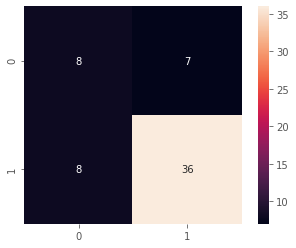

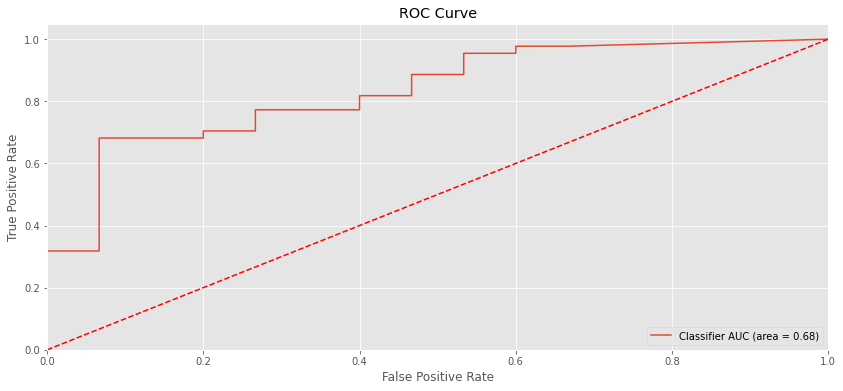

<Figure size 1008x432 with 0 Axes>

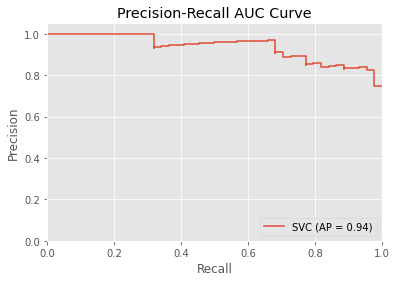

In [42]:
svm_train_accuracy, svm_test_accuracy, svm_clf_conf_matrix, svm_clf_precision, svm_clf_recall, svm_clf_f1, svm_clf_roc_auc, svm_clf_gini_coeff, svm_clf_fpr, svm_clf_tpr, svm_clf_thresholds = classifier_metrics(svm_clf)

SVM with Radial Basis Kernel

In [43]:
svm_clf_rbf = SVC(kernel = 'rbf', C = 100, gamma='auto', probability=True)

In [44]:
svm_clf_rbf.fit(X_train, y_train)

SVC(C=100, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

Train Accuracy :  1.0
Test Accuracy :  0.831

Classification Report

              precision    recall  f1-score   support

           0       1.00      0.33      0.50        15
           1       0.81      1.00      0.90        44

    accuracy                           0.83        59
   macro avg       0.91      0.67      0.70        59
weighted avg       0.86      0.83      0.80        59


Precision Score:
 0.815

Recall Score:
 1.0

F1 Score:
 0.898

ROC AUC Score:
 0.667

Gini Coefficient :
 0.33

Confusion Matrix:



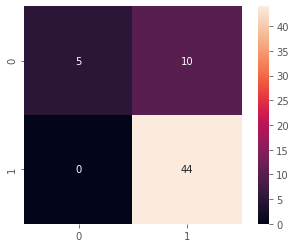

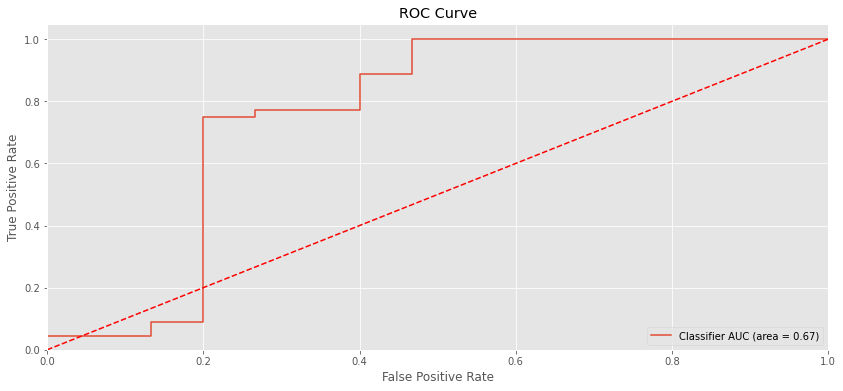

<Figure size 1008x432 with 0 Axes>

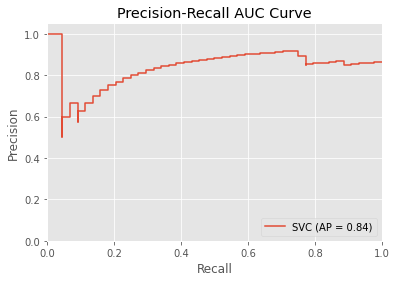

In [45]:
svm_train_accuracy, svm_test_accuracy, svm_clf_conf_matrix, svm_clf_precision, svm_clf_recall, svm_clf_f1, svm_clf_roc_auc, svm_clf_gini_coeff, svm_clf_fpr, svm_clf_tpr, svm_clf_thresholds = classifier_metrics(svm_clf_rbf)

### Logistic Regression

In [46]:
log_reg_clf = LogisticRegression(solver='lbfgs', n_jobs=-1)

In [47]:
log_reg_clf.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=-1, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Train Accuracy :  0.875
Test Accuracy :  0.864

Classification Report

              precision    recall  f1-score   support

           0       0.89      0.53      0.67        15
           1       0.86      0.98      0.91        44

    accuracy                           0.86        59
   macro avg       0.87      0.76      0.79        59
weighted avg       0.87      0.86      0.85        59


Precision Score:
 0.86

Recall Score:
 0.977

F1 Score:
 0.915

ROC AUC Score:
 0.755

Gini Coefficient :
 0.51

Confusion Matrix:



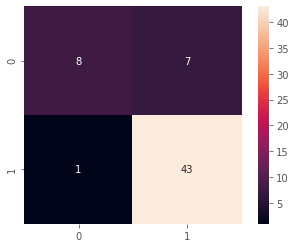

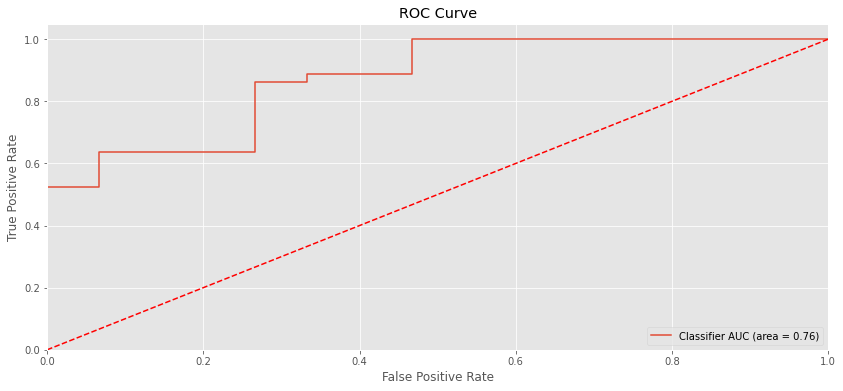

<Figure size 1008x432 with 0 Axes>

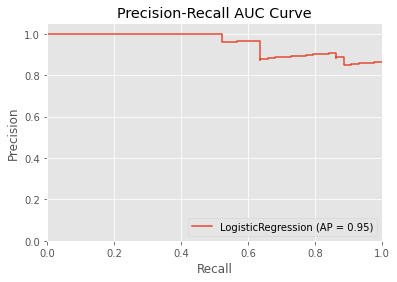

In [48]:
lr_train_accuracy, lr_test_accuracy, lr_clf_conf_matrix, lr_clf_precision, lr_clf_recall, lr_clf_f1, lr_clf_roc_auc, lr_clf_gini_coeff, lr_clf_fpr, lr_clf_tpr, lr_clf_thresholds = classifier_metrics(log_reg_clf)

Logistic Regression, being a Parametric Method has the closed Train and Test Accuracy Scores, showing that the model hasn't overfitted. 

### Naive Bayes Classifier

In [49]:
gnb_clf = GaussianNB()

In [50]:
gnb_clf.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

Train Accuracy :  0.765
Test Accuracy :  0.661

Classification Report

              precision    recall  f1-score   support

           0       0.42      0.93      0.58        15
           1       0.96      0.57      0.71        44

    accuracy                           0.66        59
   macro avg       0.69      0.75      0.65        59
weighted avg       0.82      0.66      0.68        59


Precision Score:
 0.962

Recall Score:
 0.568

F1 Score:
 0.714

ROC AUC Score:
 0.751

Gini Coefficient :
 0.5

Confusion Matrix:



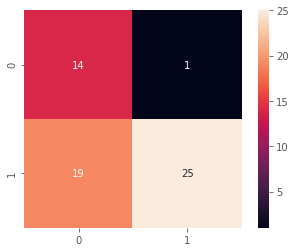

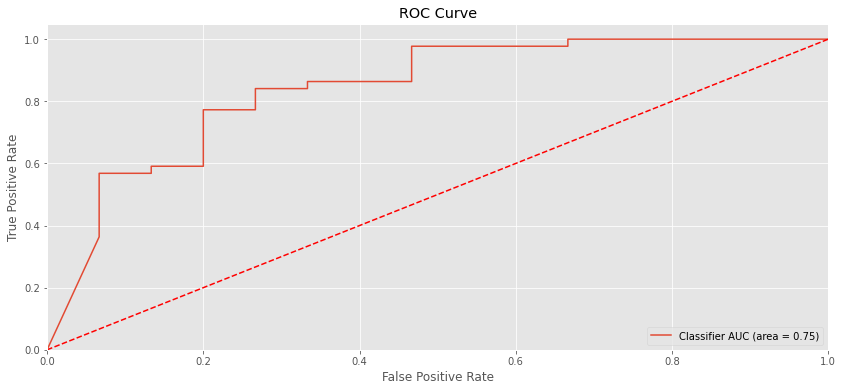

<Figure size 1008x432 with 0 Axes>

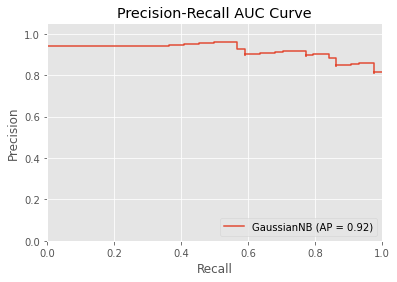

In [51]:
gnb_train_accuracy, gnb_test_accuracy, gnb_clf_conf_matrix, gnb_clf_precision, gnb_clf_recall, gnb_clf_f1, gnb_clf_roc_auc, gnb_clf_gini_coeff, gnb_clf_fpr, gnb_clf_tpr, gnb_clf_thresholds = classifier_metrics(gnb_clf)

Given dataset has lot of multicollinear features, which defeats the core 'Naive' assumption of Gaussian Naive Bayes algorithm. This is visible from the very-average results displayed by the model.

### Decision Tree Classifier

In [52]:
dt_clf = DecisionTreeClassifier(criterion='entropy', random_state=24)

In [53]:
dt_clf.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=24, splitter='best')

Train Accuracy :  1.0
Test Accuracy :  0.847

Classification Report

              precision    recall  f1-score   support

           0       0.64      0.93      0.76        15
           1       0.97      0.82      0.89        44

    accuracy                           0.85        59
   macro avg       0.80      0.88      0.82        59
weighted avg       0.89      0.85      0.86        59


Precision Score:
 0.973

Recall Score:
 0.818

F1 Score:
 0.889

ROC AUC Score:
 0.876

Gini Coefficient :
 0.75

Confusion Matrix:



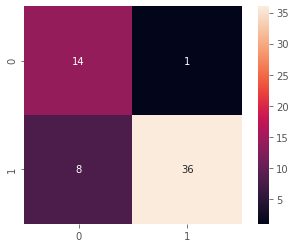

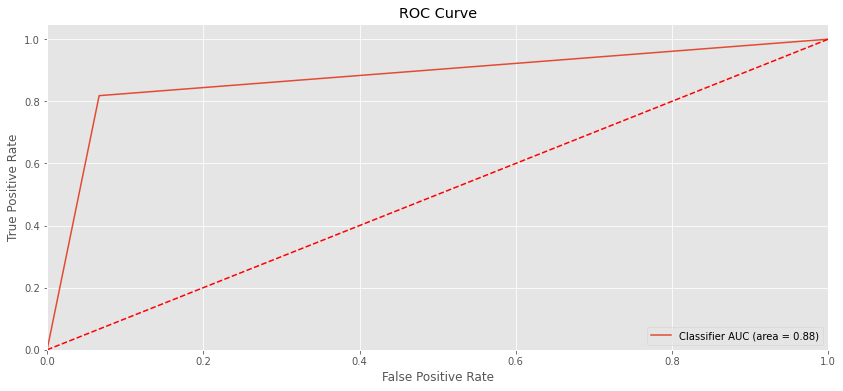

<Figure size 1008x432 with 0 Axes>

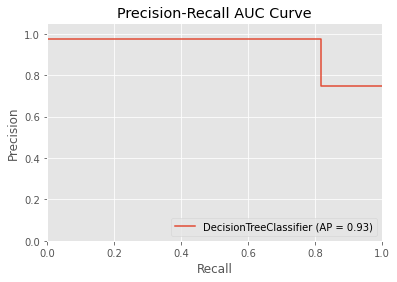

In [54]:
dt_train_accuracy, dt_test_accuracy, dt_clf_conf_matrix, dt_clf_precision, dt_clf_recall, dt_clf_f1, dt_clf_roc_auc, dt_clf_gini_coeff, dt_clf_fpr, dt_clf_tpr, dt_clf_thresholds = classifier_metrics(dt_clf)

#### Visualising the Decision Tree

In [55]:
text_representation = tree.export_text(dt_clf)
print(text_representation)

|--- feature_21 <= 0.13
|   |--- feature_15 <= 25.97
|   |   |--- class: 0
|   |--- feature_15 >  25.97
|   |   |--- feature_21 <= 0.10
|   |   |   |--- class: 0
|   |   |--- feature_21 >  0.10
|   |   |   |--- class: 1
|--- feature_21 >  0.13
|   |--- feature_9 <= 0.19
|   |   |--- feature_0 <= 117.88
|   |   |   |--- feature_14 <= 0.00
|   |   |   |   |--- class: 1
|   |   |   |--- feature_14 >  0.00
|   |   |   |   |--- class: 0
|   |   |--- feature_0 >  117.88
|   |   |   |--- feature_15 <= 21.81
|   |   |   |   |--- class: 0
|   |   |   |--- feature_15 >  21.81
|   |   |   |   |--- class: 1
|   |--- feature_9 >  0.19
|   |   |--- feature_0 <= 208.80
|   |   |   |--- class: 1
|   |   |--- feature_0 >  208.80
|   |   |   |--- class: 0



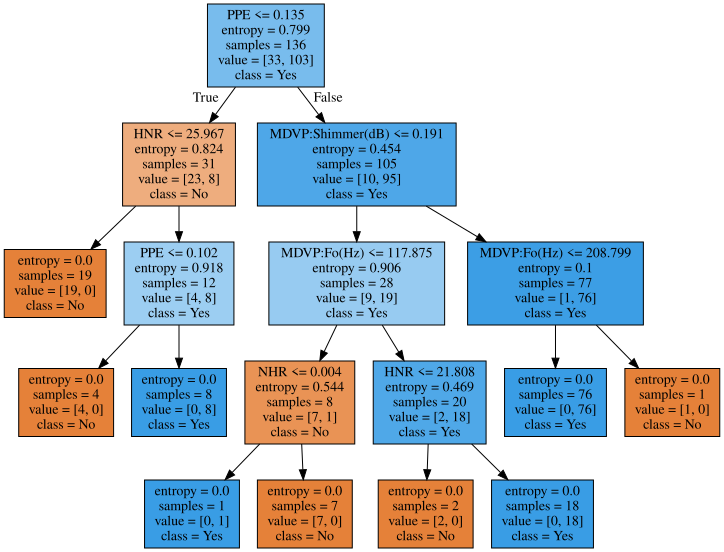

In [56]:
import graphviz
dot_data = tree.export_graphviz(dt_clf, out_file=None, 
                                feature_names=X.columns,  
                                class_names=['No', 'Yes'],
                                filled=True)

graph = graphviz.Source(dot_data, format="png") 
graph

In [57]:
! pip install dtreeviz

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


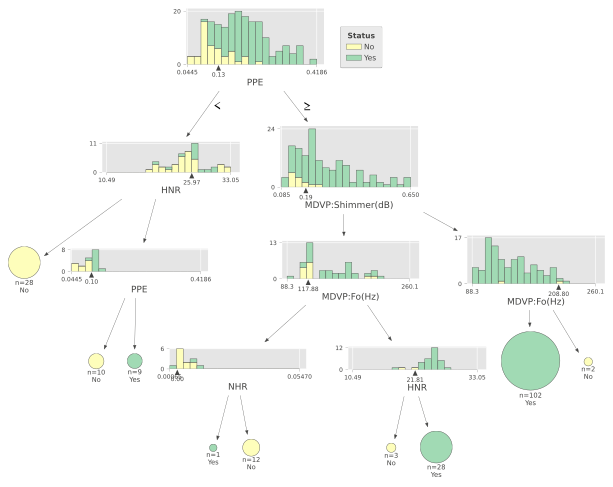

In [57]:
from dtreeviz.trees import dtreeviz # remember to load the package

viz = dtreeviz(dt_clf, X, y,
                target_name="Status",
                feature_names=X.columns,
                class_names=['No', 'Yes'])

viz

## Step 8: Model Building - Meta-classifier

#### Stacking Classifier using SVM, LogReg, NB and Decision Tree Models

In [58]:
stk_clf = StackingClassifier(estimators=[('SVC', svm_clf_rbf), ('LogR', log_reg_clf), ('GNB', gnb_clf), ('DT', dt_clf)], 
                             final_estimator=dt_clf)
#DecisionTreeClassifier() is used as the final_estimator for this StackingClassifier.

In [59]:
stk_clf.fit(X_train, y_train)

StackingClassifier(cv=None,
                   estimators=[('SVC',
                                SVC(C=100, break_ties=False, cache_size=200,
                                    class_weight=None, coef0=0.0,
                                    decision_function_shape='ovr', degree=3,
                                    gamma='auto', kernel='rbf', max_iter=-1,
                                    probability=True, random_state=None,
                                    shrinking=True, tol=0.001, verbose=False)),
                               ('LogR',
                                LogisticRegression(C=1.0, class_weight=None,
                                                   dual=False,
                                                   fit_intercept=True,...
                   final_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                          class_weight=None,
                                                          criterion='entropy',


Train Accuracy :  0.971
Test Accuracy :  0.797

Classification Report

              precision    recall  f1-score   support

           0       0.59      0.67      0.62        15
           1       0.88      0.84      0.86        44

    accuracy                           0.80        59
   macro avg       0.73      0.75      0.74        59
weighted avg       0.81      0.80      0.80        59


Precision Score:
 0.881

Recall Score:
 0.841

F1 Score:
 0.86

ROC AUC Score:
 0.754

Gini Coefficient :
 0.51

Confusion Matrix:



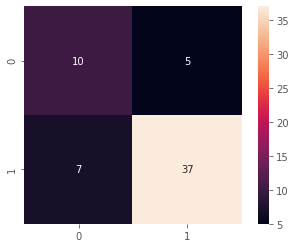

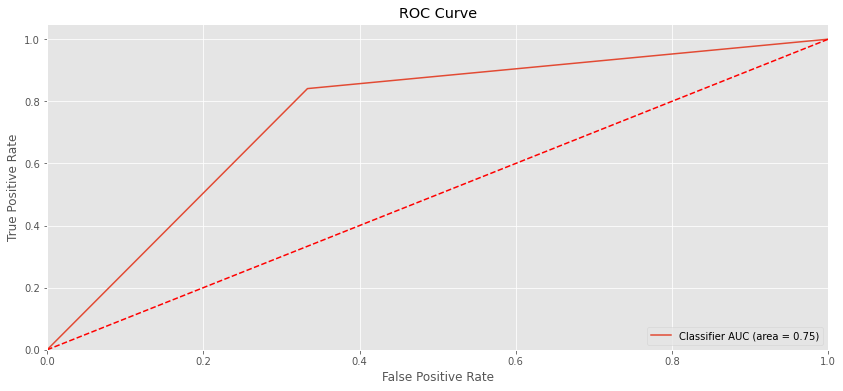

<Figure size 1008x432 with 0 Axes>

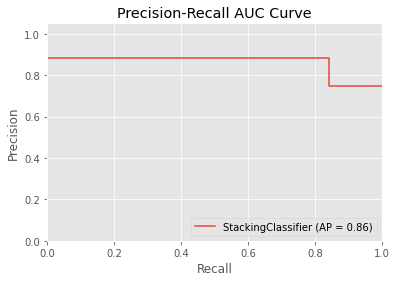

In [60]:
stk_train_accuracy, stk_test_accuracy, stk_clf_conf_matrix, stk_clf_precision, stk_clf_recall, stk_clf_f1, stk_clf_roc_auc, stk_clf_gini_coeff, stk_clf_fpr, stk_clf_tpr, stk_clf_thresholds = classifier_metrics(stk_clf)

- For this particular dataset, StackingClassifier doesn't provide 
 better results than the standalone models such as SVM and Log-Reg but still the results are not at par with Decision Tree Classifier. 

## Step 9: Model Building - Ensembles

Let us start with a Bagging Ensemble - Random Forest! 

### Random Forest Classifier

In [61]:
rf_clf = RandomForestClassifier(n_estimators=100, criterion='entropy', n_jobs=-1, oob_score=True, random_state=24)

In [62]:
rf_clf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=True, random_state=24, verbose=0,
                       warm_start=False)

In [63]:
print("Out-of-bag Evaluation Score for Random Forest : ", rf_clf.oob_score_.round(3))

Out-of-bag Evaluation Score for Random Forest :  0.912


Train Accuracy :  1.0
Test Accuracy :  0.898

Classification Report

              precision    recall  f1-score   support

           0       0.85      0.73      0.79        15
           1       0.91      0.95      0.93        44

    accuracy                           0.90        59
   macro avg       0.88      0.84      0.86        59
weighted avg       0.90      0.90      0.90        59


Precision Score:
 0.913

Recall Score:
 0.955

F1 Score:
 0.933

ROC AUC Score:
 0.844

Gini Coefficient :
 0.69

Confusion Matrix:



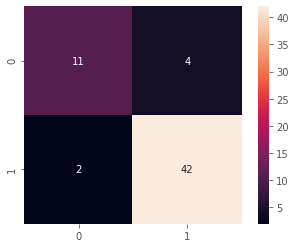

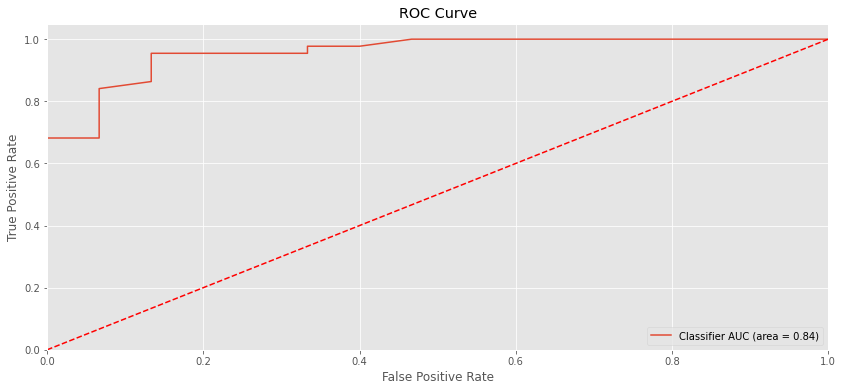

<Figure size 1008x432 with 0 Axes>

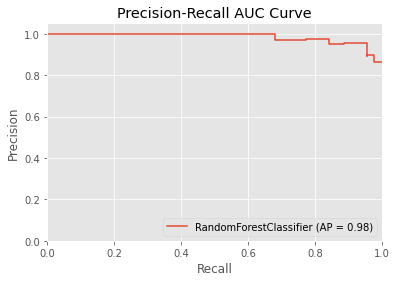

In [64]:
rf_train_accuracy, rf_test_accuracy, rf_clf_conf_matrix, rf_clf_precision, rf_clf_recall, rf_clf_f1, rf_clf_roc_auc, rf_clf_gini_coeff, rf_clf_fpr, rf_clf_tpr, rf_clf_thresholds = classifier_metrics(rf_clf)

In [65]:
def plot_feature_rank(clf):
  feature_rank = pd.DataFrame({
      'feature' : X_train.columns,
      'importance' : clf.feature_importances_.round(3)     
      }
  )

  feature_rank = feature_rank.sort_values('importance', ascending=False)

  print("Amount of variance explained by the predictors\n")

  feature_rank['cumulative_sum'] = feature_rank['importance'].cumsum()*100
    
  plt.figure(figsize=(8,6))
  sns.barplot(y='feature', x='importance', data=feature_rank)
  plt.show()

  return feature_rank


Amount of variance explained by the predictors



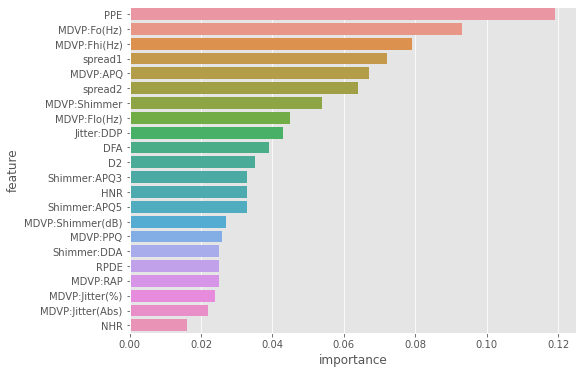

,feature,importance,cumulative_sum
21,PPE,0.119,11.9
0,MDVP:Fo(Hz),0.093,21.2
1,MDVP:Fhi(Hz),0.079,29.1
18,spread1,0.072,36.3
12,MDVP:APQ,0.067,43.0
19,spread2,0.064,49.4
8,MDVP:Shimmer,0.054,54.8
2,MDVP:Flo(Hz),0.045,59.3
7,Jitter:DDP,0.043,63.6
17,DFA,0.039,67.5


In [66]:
rf_feature_rank = plot_feature_rank(rf_clf)
rf_feature_rank

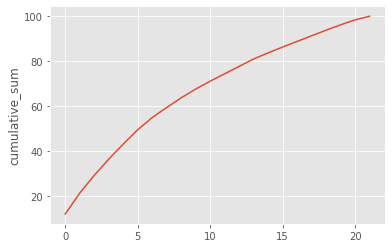

In [67]:
sns.lineplot(y=rf_feature_rank['cumulative_sum'], x=np.arange(0,22,1))

- We can see that the `PPE` feature is the most important feature as per RandomForestClassifier and DecisionTreeClassifier algorithms. 
- `HNR` which has negative correlation with target variable is labeled as 2nd most important feature by DecisionTreeClassifier however, it is given moderate priority by RandomForestClassifier. 

### Hyperparameter Tuning for Random Forest Classifier

In [68]:
rf_clf_1 = RandomForestClassifier(random_state=24, n_jobs=-1, oob_score=True)
rf_clf_1.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=True, random_state=24, verbose=0,
                       warm_start=False)

In [69]:
param_grid = {
    'n_estimators':[1,50,100,150,200],
    'max_depth':[10,20,50,80,100]
    }

rf_tuned_clf = GridSearchCV(rf_clf_1,param_grid=param_grid, scoring='roc_auc',cv=StratifiedKFold(n_splits=10),n_jobs=-1)

In [70]:
rf_tuned_clf.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=-1,
                                          

In [71]:
rf_tuned_clf.best_estimator_

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=True, random_state=24, verbose=0,
                       warm_start=False)

In [72]:
print("Out-of-bag Evaluation Score for Random Forest Tuned : ", rf_tuned_clf.best_estimator_.oob_score_.round(3))

Out-of-bag Evaluation Score for Random Forest Tuned :  0.875


In [73]:
rf_tuned_clf.best_params_

{'max_depth': 10, 'n_estimators': 100}

In [74]:
rf_tuned_cv = pd.DataFrame(rf_tuned_clf.cv_results_)
rf_tuned_cv

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.107754,0.001715,0.004255,0.001938,10,1,"{'max_depth': 10, 'n_estimators': 1}",0.954545,0.742424,0.833333,0.625,0.775,0.775,0.85,0.633333,0.733333,0.95,0.787197,0.107596,21
1,0.153786,0.004973,0.104659,0.000364,10,50,"{'max_depth': 10, 'n_estimators': 50}",1.000000,0.848485,1.000000,1.000,1.000,0.975,1.00,0.800000,0.816667,1.00,0.944015,0.081148,16
2,0.307127,0.006980,0.104682,0.000350,10,100,"{'max_depth': 10, 'n_estimators': 100}",1.000000,0.833333,1.000000,1.000,1.000,0.975,1.00,0.850000,0.900000,1.00,0.955833,0.064340,1
3,0.487946,0.024656,0.105472,0.000887,10,150,"{'max_depth': 10, 'n_estimators': 150}",1.000000,0.848485,1.000000,1.000,1.000,0.975,1.00,0.833333,0.900000,1.00,0.955682,0.064590,6
4,0.623832,0.023430,0.105066,0.000356,10,200,"{'max_depth': 10, 'n_estimators': 200}",1.000000,0.848485,1.000000,1.000,1.000,0.975,1.00,0.800000,0.833333,1.00,0.945682,0.078648,11
5,0.106672,0.001821,0.003263,0.000741,20,1,"{'max_depth': 20, 'n_estimators': 1}",0.954545,0.742424,0.833333,0.625,0.775,0.775,0.85,0.633333,0.733333,0.95,0.787197,0.107596,21
6,0.149320,0.006334,0.105591,0.001649,20,50,"{'max_depth': 20, 'n_estimators': 50}",1.000000,0.848485,1.000000,1.000,1.000,0.975,1.00,0.800000,0.816667,1.00,0.944015,0.081148,16
7,0.305359,0.005190,0.105759,0.002004,20,100,"{'max_depth': 20, 'n_estimators': 100}",1.000000,0.833333,1.000000,1.000,1.000,0.975,1.00,0.850000,0.900000,1.00,0.955833,0.064340,1
8,0.496190,0.019782,0.105224,0.000306,20,150,"{'max_depth': 20, 'n_estimators': 150}",1.000000,0.848485,1.000000,1.000,1.000,0.975,1.00,0.833333,0.900000,1.00,0.955682,0.064590,6
9,0.661934,0.017722,0.105199,0.000272,20,200,"{'max_depth': 20, 'n_estimators': 200}",1.000000,0.848485,1.000000,1.000,1.000,0.975,1.00,0.800000,0.833333,1.00,0.945682,0.078648,11


Train Accuracy :  1.0
Test Accuracy :  0.942

Classification Report

              precision    recall  f1-score   support

           0       0.80      0.80      0.80        15
           1       0.93      0.93      0.93        44

    accuracy                           0.90        59
   macro avg       0.87      0.87      0.87        59
weighted avg       0.90      0.90      0.90        59


Precision Score:
 0.932

Recall Score:
 0.932

F1 Score:
 0.932

ROC AUC Score:
 0.866

Gini Coefficient :
 0.73

Confusion Matrix:



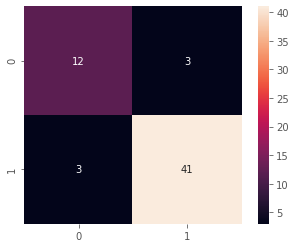

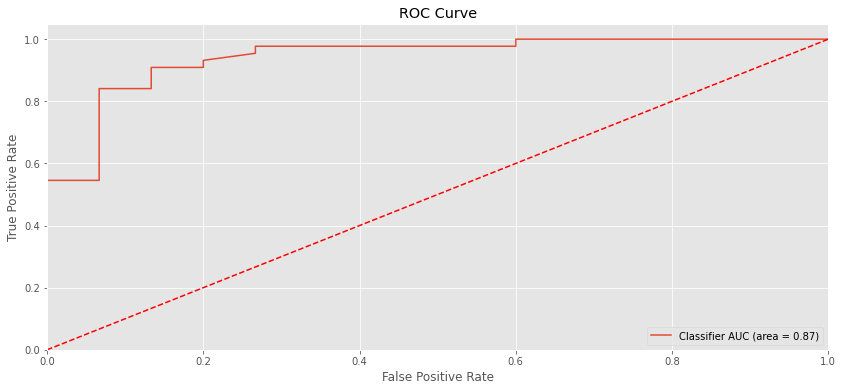

<Figure size 1008x432 with 0 Axes>

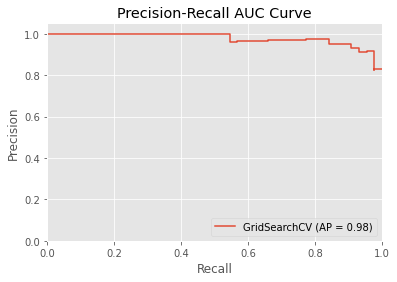

In [75]:
rf_tuned_train_accuracy, rf_tuned_test_accuracy, rf_tuned_clf_conf_matrix, rf_tuned_clf_precision, rf_tuned_clf_recall, rf_tuned_clf_f1, rf_tuned_clf_roc_auc, rf_tuned_clf_gini_coeff, rf_tuned_clf_fpr, rf_tuned_clf_tpr, rf_tuned_clf_thresholds = classifier_metrics(rf_tuned_clf)

#### Feature Importance for Random Forest Classifier Tuned

Amount of variance explained by the predictors



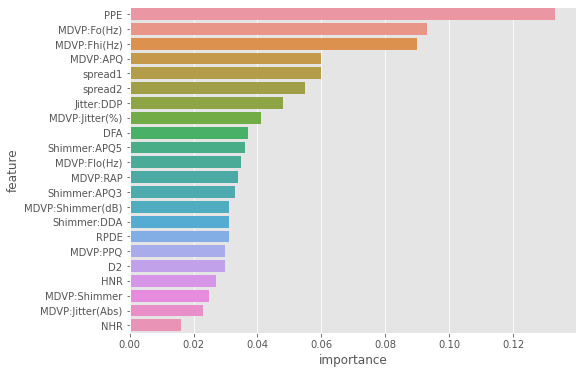

,feature,importance,cumulative_sum
21,PPE,0.133,13.3
0,MDVP:Fo(Hz),0.093,22.6
1,MDVP:Fhi(Hz),0.090,31.6
12,MDVP:APQ,0.060,37.6
18,spread1,0.060,43.6
19,spread2,0.055,49.1
7,Jitter:DDP,0.048,53.9
3,MDVP:Jitter(%),0.041,58.0
17,DFA,0.037,61.7
11,Shimmer:APQ5,0.036,65.3


In [76]:
rf_tuned_feature_rank = plot_feature_rank(rf_tuned_clf.best_estimator_)
rf_tuned_feature_rank

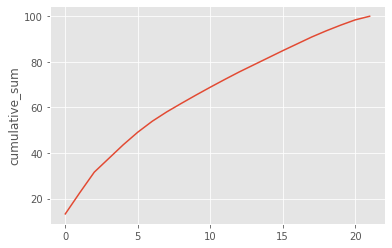

In [77]:
sns.lineplot(y=rf_tuned_feature_rank['cumulative_sum'], x=np.arange(0,22,1))

So, RandomForest has provided spectacular results, as expected. 
Let us try with a Boosting Ensemble - AdaBoost (Adaptive Boosting)

### AdaBoost Classifier

In [78]:
ada_clf = AdaBoostClassifier(algorithm='SAMME.R', random_state=24) 
#Default Estimator is DecisionTreeClassifier() with max_depth = 1 (Tree Stump)

In [79]:
ada_clf.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=24)

Train Accuracy :  1.0
Test Accuracy :  0.746

Classification Report

              precision    recall  f1-score   support

           0       0.50      0.47      0.48        15
           1       0.82      0.84      0.83        44

    accuracy                           0.75        59
   macro avg       0.66      0.65      0.66        59
weighted avg       0.74      0.75      0.74        59


Precision Score:
 0.822

Recall Score:
 0.841

F1 Score:
 0.831

ROC AUC Score:
 0.654

Gini Coefficient :
 0.31

Confusion Matrix:



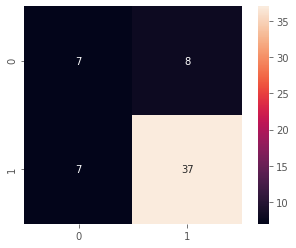

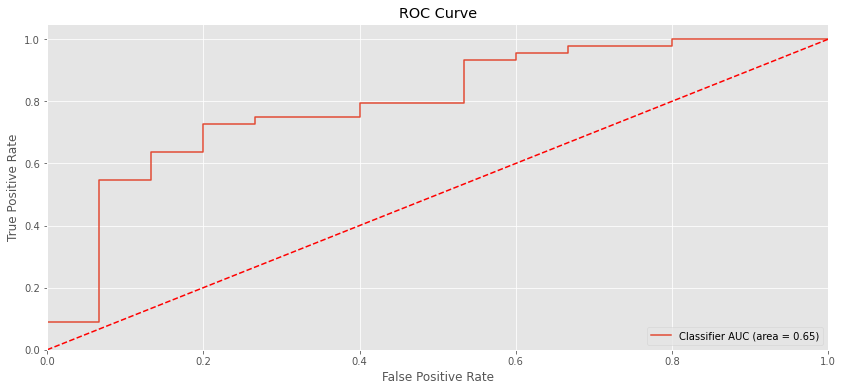

<Figure size 1008x432 with 0 Axes>

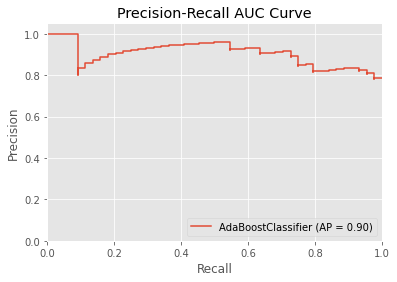

In [80]:
ada_train_accuracy, ada_test_accuracy, ada_clf_conf_matrix, ada_clf_precision, ada_clf_recall, ada_clf_f1, ada_clf_roc_auc, ada_clf_gini_coeff, ada_clf_fpr, ada_clf_tpr, ada_clf_thresholds = classifier_metrics(ada_clf)

### Hyperparameter Tuning for AdaBoost Classifier with different Base Estimators

SVM, Logistic Regression and Random Forest Classifiers are provided as the different Base Estimators for the AdaBoost Classifier. Let us see which classifier is picked by the GridSearch. 

In [81]:
param_grid = {
    'base_estimator' : [svm_clf_rbf, log_reg_clf, rf_clf],
    'n_estimators': [1,50,100,150,200],
    'learning_rate': [0.01, 0.05, 0.1, 1.0]
    }

ada_tuned_clf = GridSearchCV(AdaBoostClassifier(random_state=24),param_grid=param_grid, scoring='roc_auc',cv=StratifiedKFold(n_splits=10),n_jobs=-1)

In [82]:
ada_tuned_clf.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=50,
                                          random_state=24),
             iid='deprecated', n_jobs=-1,
             param_grid={'base_estimator': [SVC(C=100, break_ties=False,
                                                cache_size=200,
                                                class_weight=None, coef0=0.0,
                                                decision_f...
                                                                   min_impurity_decrease=0.0,
                                                                   min_impurity_split=None,
                                                                   min_samples_leaf=1,
                                  

In [83]:
ada_tuned_clf.best_params_

{'base_estimator': RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                        criterion='entropy', max_depth=None, max_features='auto',
                        max_leaf_nodes=None, max_samples=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=1, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, n_estimators=100,
                        n_jobs=-1, oob_score=True, random_state=24, verbose=0,
                        warm_start=False),
 'learning_rate': 0.01,
 'n_estimators': 1}

- We can see that out of the given Classifiers, RandomForest Classifier is picked by the GridSearch based on the metrics. 
- Note that we have used a Bagging Ensemble 'RandomForest' as a Base Estimator for a Boosting Ensemble 'AdaBoost'! 

Train Accuracy :  1.0
Test Accuracy :  0.959

Classification Report

              precision    recall  f1-score   support

           0       0.92      0.80      0.86        15
           1       0.93      0.98      0.96        44

    accuracy                           0.93        59
   macro avg       0.93      0.89      0.91        59
weighted avg       0.93      0.93      0.93        59


Precision Score:
 0.935

Recall Score:
 0.977

F1 Score:
 0.956

ROC AUC Score:
 0.889

Gini Coefficient :
 0.78

Confusion Matrix:



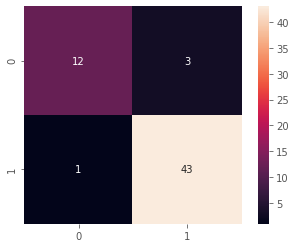

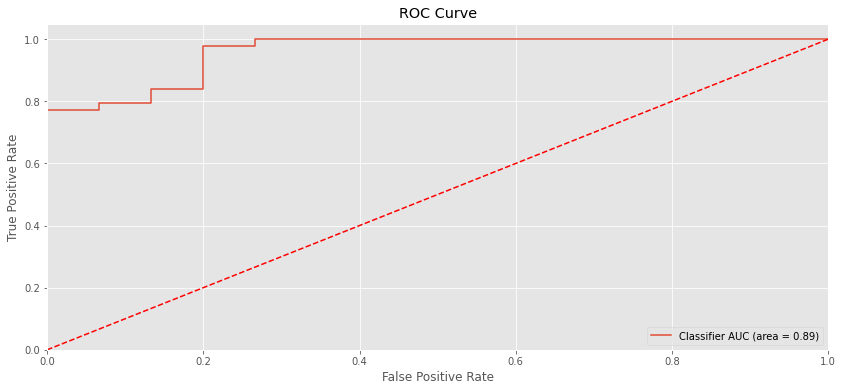

<Figure size 1008x432 with 0 Axes>

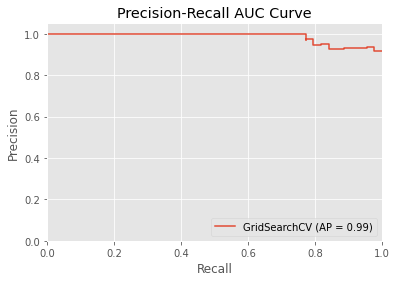

In [84]:
ada_tuned_train_accuracy, ada_tuned_test_accuracy, ada_tuned_clf_conf_matrix, ada_tuned_clf_precision, ada_tuned_clf_recall, ada_tuned_clf_f1, ada_tuned_clf_roc_auc, ada_tuned_clf_gini_coeff, ada_tuned_clf_fpr, ada_tuned_clf_tpr, ada_tuned_clf_thresholds = classifier_metrics(ada_tuned_clf)

So, using ***a Bagging Ensemble 'RandomForest' as a Base Estimator for a Boosting Ensemble 'AdaBoost' has yielded the BEST results*** so far out of all the models. 

Let us try with the Gradient Boosting methods next. 

### XGBoost Classifier

Instantiating the XGBoost (Extreme Gradient Boosting) Classifier.
We have used 'gbtree' which used Decision Trees as the base estimator. Also the objective is 'binary:logistic' which uses Cross-Entropy Log Loss for arriving at the classification predictions. 

In [85]:
xgb_clf = xgb.XGBClassifier(
    booster='gbtree', 
    objective='binary:logistic', 
    random_state=24, 
    n_jobs=-1)

Now, let us fit the XGB model. Note, that we have used early_stopping_rounds = 10, which means that the model will NOT grow the entire tree and prune it back (unlike Random Forest) and the tree growth will stop if there is no improvement in the eval_metric for 10 rounds (epochs). 

In [86]:
xgb_clf.fit(
    X_train, 
    y_train,
    verbose=True,
    early_stopping_rounds=10,  #Stop the Tree Growth when there is no visible improvement for 10 iterations
    eval_metric='auc', #ROC AUC Curve
    eval_set=[(X_test, y_test)]
    )

[0]	validation_0-auc:0.813636
Will train until validation_0-auc hasn't improved in 10 rounds.
[1]	validation_0-auc:0.813636
[2]	validation_0-auc:0.806061
[3]	validation_0-auc:0.894697
[4]	validation_0-auc:0.859848
[5]	validation_0-auc:0.905303
[6]	validation_0-auc:0.918939
[7]	validation_0-auc:0.929545
[8]	validation_0-auc:0.950758
[9]	validation_0-auc:0.949242
[10]	validation_0-auc:0.945455
[11]	validation_0-auc:0.956061
[12]	validation_0-auc:0.954545
[13]	validation_0-auc:0.956061
[14]	validation_0-auc:0.94697
[15]	validation_0-auc:0.95
[16]	validation_0-auc:0.95
[17]	validation_0-auc:0.954545
[18]	validation_0-auc:0.940909
[19]	validation_0-auc:0.945455
[20]	validation_0-auc:0.945455
[21]	validation_0-auc:0.948485
Stopping. Best iteration:
[11]	validation_0-auc:0.956061



XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=24,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [87]:
xgb_clf.best_score

0.956061

Train Accuracy :  0.971
Test Accuracy :  0.898

Classification Report

              precision    recall  f1-score   support

           0       0.80      0.80      0.80        15
           1       0.93      0.93      0.93        44

    accuracy                           0.90        59
   macro avg       0.87      0.87      0.87        59
weighted avg       0.90      0.90      0.90        59


Precision Score:
 0.932

Recall Score:
 0.932

F1 Score:
 0.932

ROC AUC Score:
 0.866

Gini Coefficient :
 0.73

Confusion Matrix:



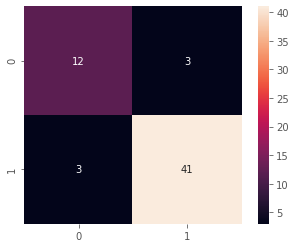

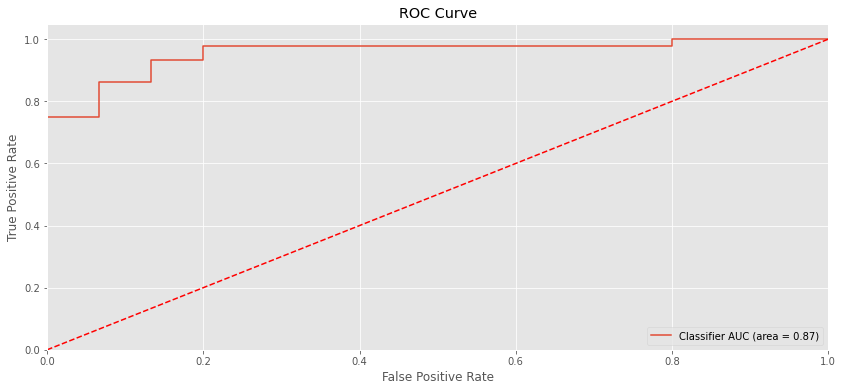

<Figure size 1008x432 with 0 Axes>

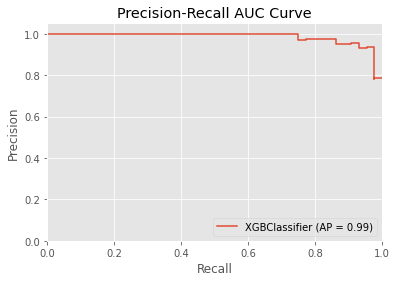

In [88]:
xgb_train_accuracy, xgb_test_accuracy, xgb_clf_conf_matrix, xgb_clf_precision, xgb_clf_recall, xgb_clf_f1, xgb_clf_roc_auc, xgb_clf_gini_coeff, xgb_clf_fpr, xgb_clf_tpr, xgb_clf_thresholds = classifier_metrics(xgb_clf)

### Hyperparameter Tuning for XGBoost

In [89]:
xgb_estimator = xgb.XGBClassifier(
    objective='binary:logistic',
    seed=24,
    random_state=24
    )

In [90]:
param_grid = {
    'max_depth' : [3,4,5,6], #Tree Depth
    'learning_rate' : [0.1,0.01,0.05], #Shrinkage Parameter to avoid being Overfit
    'gamma' : [0,0.25,1.0], #Regularization Parameter
    'reg_lambda' : [0,1.0,10.0], #Regularization Parameter
    'scale_pos_weight' : [1,3] #For Class Imbalance handling
}

xgb_tuned_clf = GridSearchCV(xgb_estimator,param_grid=param_grid, scoring='roc_auc',cv=StratifiedKFold(n_splits=10),n_jobs=-1)

In [91]:
xgb_tuned_clf.fit(
    X_train, 
    y_train,
    verbose=True,
    early_stopping_rounds=10,  #Stop the Tree Growth when there is no visible improvement for 10 iterations
    eval_metric='auc', #ROC AUC Score
    eval_set=[(X_test, y_test)]
    )

[0]	validation_0-auc:0.796212
Will train until validation_0-auc hasn't improved in 10 rounds.
[1]	validation_0-auc:0.881818
[2]	validation_0-auc:0.862121
[3]	validation_0-auc:0.881818
[4]	validation_0-auc:0.869697
[5]	validation_0-auc:0.880303
[6]	validation_0-auc:0.868182
[7]	validation_0-auc:0.881818
[8]	validation_0-auc:0.886364
[9]	validation_0-auc:0.891667
[10]	validation_0-auc:0.896212
[11]	validation_0-auc:0.894697
[12]	validation_0-auc:0.89697
[13]	validation_0-auc:0.89697
[14]	validation_0-auc:0.904545
[15]	validation_0-auc:0.906061
[16]	validation_0-auc:0.908333
[17]	validation_0-auc:0.912121
[18]	validation_0-auc:0.912121
[19]	validation_0-auc:0.912121
[20]	validation_0-auc:0.915152
[21]	validation_0-auc:0.913636
[22]	validation_0-auc:0.910606
[23]	validation_0-auc:0.910606
[24]	validation_0-auc:0.92197
[25]	validation_0-auc:0.924242
[26]	validation_0-auc:0.922727
[27]	validation_0-auc:0.928788
[28]	validation_0-auc:0.927273
[29]	validation_0-auc:0.927273
[30]	validation_0-a

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary...
                                     random_state=24, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=24, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=-1,
             param_grid={'gamma': [0, 0.25, 1.0],
                         'learning_rate': [0.1, 0.01, 0.05],
   

In [92]:
xgb_tuned_clf.best_params_

{'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'reg_lambda': 1.0,
 'scale_pos_weight': 3}

In [93]:
xgb_tuned_clf.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=24,
              reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3, seed=24,
              silent=None, subsample=1, verbosity=1)

In [94]:
xgb_tuned_clf.best_score_

0.9503787878787879

Train Accuracy :  1.0
Test Accuracy :  0.929

Classification Report

              precision    recall  f1-score   support

           0       0.80      0.80      0.80        15
           1       0.93      0.93      0.93        44

    accuracy                           0.90        59
   macro avg       0.87      0.87      0.87        59
weighted avg       0.90      0.90      0.90        59


Precision Score:
 0.932

Recall Score:
 0.932

F1 Score:
 0.932

ROC AUC Score:
 0.866

Gini Coefficient :
 0.73

Confusion Matrix:



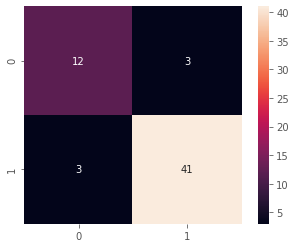

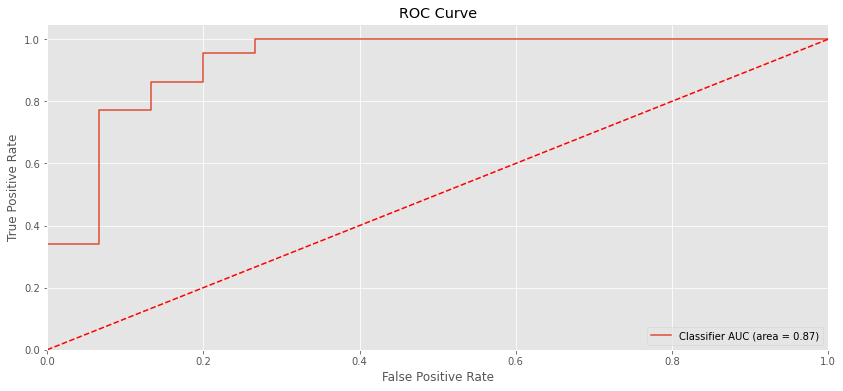

<Figure size 1008x432 with 0 Axes>

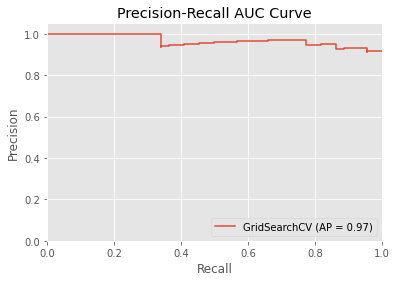

In [95]:
xgb_tuned_train_accuracy, xgb_tuned_test_accuracy, xgb_tuned_clf_conf_matrix, xgb_tuned_clf_precision, xgb_tuned_clf_recall, xgb_tuned_clf_f1, xgb_tuned_clf_roc_auc, xgb_tuned_clf_gini_coeff, xgb_tuned_clf_fpr, xgb_tuned_clf_tpr, xgb_tuned_clf_thresholds = classifier_metrics(xgb_tuned_clf)

#### Visualizing the XGBoost Tree with Lone Estimator

In [96]:
xgb_lone_estimator = xgb.XGBClassifier(
    objective='binary:logistic', 
    seed=24, 
    subsample=0.9, 
    colsample_bytree=0.5, 
    gamma = 0.25, 
    learning_rate=0.05, 
    max_depth=4,
    reg_lambda=10.0, 
    scale_pos_weight=3,
    n_estimator=1       #Single Tree for Visualisation purpose
)

In [97]:
xgb_lone_estimator.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0.25,
              learning_rate=0.05, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=None, n_estimator=1, n_estimators=100,
              n_jobs=1, nthread=None, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=3,
              seed=24, silent=None, subsample=0.9, verbosity=1)

In [98]:
xgb_bst = xgb_lone_estimator.get_booster()

for importance_type in ('weight', 'gain', 'cover', 'total_gain', 'total_cover'):
    print('%s:  ' % importance_type, xgb_bst.get_score(importance_type=importance_type))

node_params = {
    'shape' : 'box',
    'style' : 'filled, rounded',
    'fillcolor' : '#78cbe'
}

leaf_params = {
    'shape' : 'box',
    'style' : 'filled',
    'fillcolor' : '#e48038'
}

weight:   {'PPE': 51, 'NHR': 17, 'MDVP:Fhi(Hz)': 32, 'MDVP:RAP': 17, 'MDVP:Jitter(%)': 21, 'HNR': 28, 'MDVP:APQ': 17, 'spread1': 30, 'MDVP:Shimmer(dB)': 12, 'D2': 26, 'MDVP:Fo(Hz)': 58, 'MDVP:Jitter(Abs)': 4, 'Shimmer:APQ3': 17, 'spread2': 31, 'RPDE': 18, 'DFA': 21, 'MDVP:Shimmer': 11, 'Shimmer:DDA': 9, 'Jitter:DDP': 5, 'MDVP:PPQ': 7, 'MDVP:Flo(Hz)': 31, 'Shimmer:APQ5': 11}
gain:   {'PPE': 6.181132057876277, 'NHR': 1.0129044245294114, 'MDVP:Fhi(Hz)': 2.355851395425, 'MDVP:RAP': 2.69709758182353, 'MDVP:Jitter(%)': 1.710053455904762, 'HNR': 2.324227399392857, 'MDVP:APQ': 1.8566596425294117, 'spread1': 4.762963635533331, 'MDVP:Shimmer(dB)': 1.5012304138333334, 'D2': 1.5376309745384613, 'MDVP:Fo(Hz)': 5.942857308482758, 'MDVP:Jitter(Abs)': 1.445187743, 'Shimmer:APQ3': 1.478248307282353, 'spread2': 2.2064315925161293, 'RPDE': 1.188305704277778, 'DFA': 1.362076158095238, 'MDVP:Shimmer': 1.478478490090909, 'Shimmer:DDA': 2.588433861111111, 'Jitter:DDP': 1.3380647174, 'MDVP:PPQ': 0.56232391457

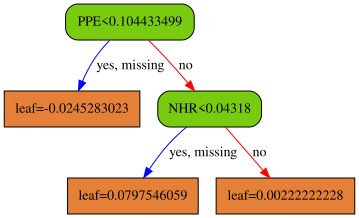

In [99]:
xgb.to_graphviz(xgb_lone_estimator,
                num_trees=0,
                size="5,5",
                condition_node_params=node_params,
                leaf_node_params=leaf_params
)

Amount of variance explained by the predictors



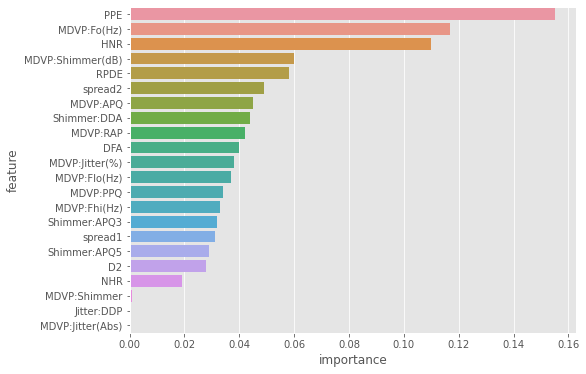

,feature,importance,cumulative_sum
21,PPE,0.155,15.500000
0,MDVP:Fo(Hz),0.117,27.200001
15,HNR,0.110,38.200005
9,MDVP:Shimmer(dB),0.060,44.200005
16,RPDE,0.058,50.000000
19,spread2,0.049,54.900002
12,MDVP:APQ,0.045,59.400005
13,Shimmer:DDA,0.044,63.800003
5,MDVP:RAP,0.042,68.000000
17,DFA,0.040,72.000000


In [100]:
xgb_feature_rank = plot_feature_rank(xgb_tuned_clf.best_estimator_)
xgb_feature_rank

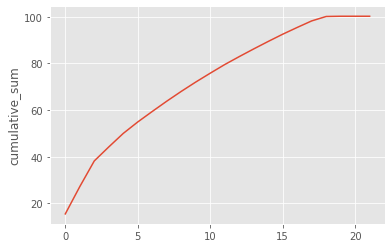

In [101]:
sns.lineplot(y=xgb_feature_rank['cumulative_sum'], x=np.arange(0,22,1))

### LightGBM Classifier

In [102]:
lgbm_clf = LGBMClassifier(
    boosting_type='gbdt',  #Gradient Boosting Decision Trees
    objective='binary',
    n_estimators=100, 
    learning_rate=0.5,
    is_unbalanced=True,
    n_jobs=-1,
    random_state=24
    )

In [103]:
lgbm_clf.fit(X_train, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', is_unbalanced=True, learning_rate=0.5,
               max_depth=-1, min_child_samples=20, min_child_weight=0.001,
               min_split_gain=0.0, n_estimators=100, n_jobs=-1, num_leaves=31,
               objective='binary', random_state=24, reg_alpha=0.0,
               reg_lambda=0.0, silent=True, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

Train Accuracy :  1.0
Test Accuracy :  0.881

Classification Report

              precision    recall  f1-score   support

           0       0.75      0.80      0.77        15
           1       0.93      0.91      0.92        44

    accuracy                           0.88        59
   macro avg       0.84      0.85      0.85        59
weighted avg       0.88      0.88      0.88        59


Precision Score:
 0.93

Recall Score:
 0.909

F1 Score:
 0.92

ROC AUC Score:
 0.855

Gini Coefficient :
 0.71

Confusion Matrix:



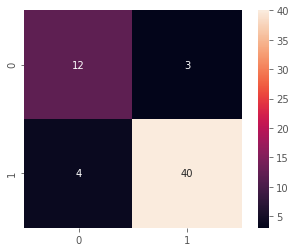

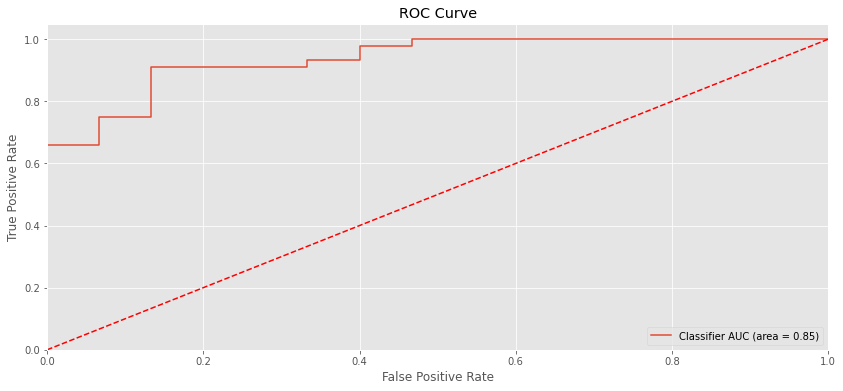

<Figure size 1008x432 with 0 Axes>

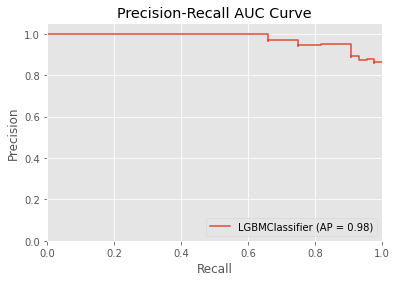

In [104]:
lgbm_train_accuracy, lgbm_test_accuracy, lgbm_clf_conf_matrix, lgbm_clf_precision, lgbm_clf_recall, lgbm_clf_f1, lgbm_clf_roc_auc, lgbm_clf_gini_coeff, lgbm_clf_fpr, lgbm_clf_tpr, lgbm_clf_thresholds = classifier_metrics(lgbm_clf)

Now, let us try out (greedy) Stacking with Random Forest, XGBoost and LightGBM models!  

In [105]:
greedy_stk_clf = StackingClassifier(estimators=[('RF', rf_tuned_clf), ('XBG', xgb_tuned_clf), ('LGBM', lgbm_clf)], final_estimator=xgb_tuned_clf)

In [106]:
greedy_stk_clf.fit(X_train, y_train)

StackingClassifier(cv=None,
                   estimators=[('RF',
                                GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                                             error_score=nan,
                                             estimator=RandomForestClassifier(bootstrap=True,
                                                                              ccp_alpha=0.0,
                                                                              class_weight=None,
                                                                              criterion='gini',
                                                                              max_depth=None,
                                                                              max_features='auto',
                                                                              max_leaf_nodes=None,
                                                                              max_sample

Train Accuracy :  1.0
Test Accuracy :  0.831

Classification Report

              precision    recall  f1-score   support

           0       0.65      0.73      0.69        15
           1       0.90      0.86      0.88        44

    accuracy                           0.83        59
   macro avg       0.78      0.80      0.79        59
weighted avg       0.84      0.83      0.83        59


Precision Score:
 0.905

Recall Score:
 0.864

F1 Score:
 0.884

ROC AUC Score:
 0.798

Gini Coefficient :
 0.6

Confusion Matrix:



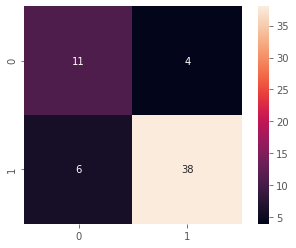

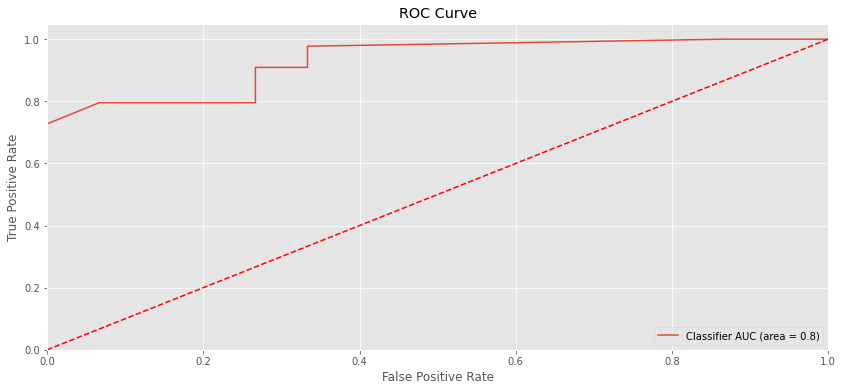

<Figure size 1008x432 with 0 Axes>

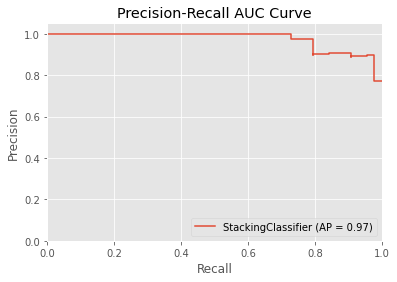

In [107]:
greedy_stk_train_accuracy, greedy_stk_test_accuracy, greedy_stk_clf_conf_matrix, greedy_stk_clf_precision, greedy_stk_clf_recall, greedy_stk_clf_f1, greedy_stk_clf_roc_auc, greedy_stk_clf_gini_coeff, greedy_stk_clf_fpr, greedy_stk_clf_tpr, greedy_stk_clf_thresholds = classifier_metrics(greedy_stk_clf)

## Step 10: Model Comparison

**List of Model Evaluation Metrics:**

1. Accuracy (1 - Misclassification Rate)
2. Precision (TP/(TP+FP))
3. Recall (TP/(TP+FN))
4. F1-Score (Harmonic Mean of Precision and Recall)
5. ROC AUC Score (Area under the ROC Curve - FPR vs TPR)
6. Gini Coefficient (2xROCAUC - 1)

Note: 

*We will look at all the parameters due to the inherent Class Imbalance in the given dataset. However, since the model is going to be used as a preliminary investigation step for a Clinic Appointment, we are more interested in reducing the 'False Negatives' and hence 'Recall' becomes one of the first metrics to be evaluated in relation to other metrics.*





In [108]:
metrics = {'Classifier':['Logistic Regression',
                         'Gaussian Naive Bayes',
                         'Support Vector Machine',
                         'Decision Trees',
                         'Random Forest',
                         'RF Hyperparameter Tuned',
                         'AdaBoost',
                         'AdaBoost Hyperparameter Tuned',
                         'Stacking Classifier',
                         'XGBoost',
                         'XGB Hyperparameter Tuned',
                         'LightGBM'],
           'Accuracy' : [lr_test_accuracy,
                         gnb_test_accuracy,
                         svm_test_accuracy,
                         dt_test_accuracy,
                         rf_test_accuracy,
                         rf_tuned_test_accuracy,
                         ada_test_accuracy,
                         ada_tuned_test_accuracy,
                         stk_test_accuracy,
                         xgb_test_accuracy,
                         xgb_tuned_test_accuracy,
                         lgbm_test_accuracy],
           'Precision':[lr_clf_precision,
                        gnb_clf_precision,
                        svm_clf_precision,
                        dt_clf_precision,
                        rf_clf_precision,
                        rf_tuned_clf_precision,
                        ada_clf_precision,
                        ada_tuned_clf_precision,
                        stk_clf_precision,
                        xgb_clf_precision,
                        xgb_tuned_clf_precision,
                        lgbm_clf_precision],
           'Recall':[lr_clf_recall,
                     gnb_clf_recall,
                     svm_clf_recall,
                     dt_clf_recall,
                     rf_clf_recall,
                     rf_tuned_clf_recall,
                     ada_clf_recall,
                     ada_tuned_clf_recall,
                     stk_clf_recall,
                     xgb_clf_recall,
                     xgb_tuned_clf_recall,
                     lgbm_clf_recall], 
           'F1-Score':[lr_clf_f1,
                       gnb_clf_f1,
                       svm_clf_f1,
                       dt_clf_f1,
                       rf_clf_f1,
                       rf_tuned_clf_f1,
                       ada_clf_f1,
                       ada_tuned_clf_f1,
                       stk_clf_f1,
                       xgb_clf_f1,
                       xgb_tuned_clf_f1,
                       lgbm_clf_f1], 
           'ROC AUC':[lr_clf_roc_auc,
                      gnb_clf_roc_auc,
                      svm_clf_roc_auc,
                      dt_clf_roc_auc,
                      rf_clf_roc_auc,
                      rf_tuned_clf_roc_auc,
                      ada_clf_roc_auc,
                      ada_tuned_clf_roc_auc,
                      stk_clf_roc_auc,
                      xgb_clf_roc_auc,
                      xgb_tuned_clf_roc_auc,
                      lgbm_clf_roc_auc], 
           'Gini Coeff':[lr_clf_gini_coeff,
                         gnb_clf_gini_coeff,
                         svm_clf_gini_coeff,
                         dt_clf_gini_coeff,
                         rf_clf_gini_coeff,
                         rf_tuned_clf_gini_coeff,
                         ada_clf_gini_coeff,
                         ada_tuned_clf_gini_coeff,
                         stk_clf_gini_coeff,
                         xgb_clf_gini_coeff,
                         xgb_tuned_clf_gini_coeff,
                         lgbm_clf_gini_coeff]
          }
model_eval_metrics = pd.DataFrame(metrics)
model_eval_metrics = model_eval_metrics.set_index('Classifier')

In [109]:
model_eval_metrics

,Accuracy,Precision,Recall,F1-Score,ROC AUC,Gini Coeff
Classifier,,,,,,
Logistic Regression,0.864,0.860000,0.977273,0.914894,0.755303,0.510606
Gaussian Naive Bayes,0.661,0.961538,0.568182,0.714286,0.750758,0.501515
Support Vector Machine,0.831,0.814815,1.000000,0.897959,0.666667,0.333333
Decision Trees,0.847,0.972973,0.818182,0.888889,0.875758,0.751515
Random Forest,0.898,0.913043,0.954545,0.933333,0.843939,0.687879
RF Hyperparameter Tuned,0.942,0.931818,0.931818,0.931818,0.865909,0.731818
AdaBoost,0.746,0.822222,0.840909,0.831461,0.653788,0.307576
AdaBoost Hyperparameter Tuned,0.959,0.934783,0.977273,0.955556,0.888636,0.777273
Stacking Classifier,0.797,0.880952,0.840909,0.860465,0.753788,0.507576


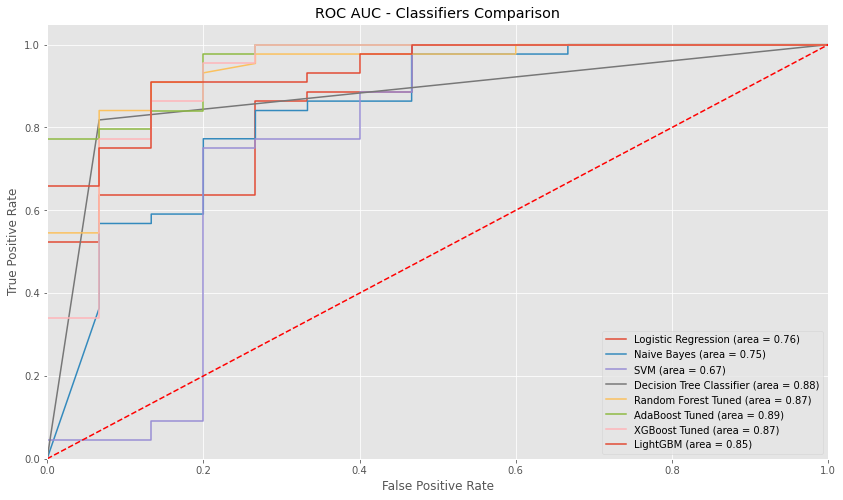

In [111]:
plt.figure(figsize = (14 , 8))

plt.plot(lr_clf_fpr, lr_clf_tpr, label = 'Logistic Regression (area = {})'.format(lr_clf_roc_auc.round(2)))

plt.plot(gnb_clf_fpr, gnb_clf_tpr, label = 'Naive Bayes (area = {})'.format(gnb_clf_roc_auc.round(2)))

plt.plot(svm_clf_fpr, svm_clf_tpr, label = 'SVM (area = {})'.format(svm_clf_roc_auc.round(2)))

plt.plot(dt_clf_fpr, dt_clf_tpr, label = 'Decision Tree Classifier (area = {})'.format(dt_clf_roc_auc.round(2)))

plt.plot(rf_tuned_clf_fpr, rf_tuned_clf_tpr, label = 'Random Forest Tuned (area = {})'.format(rf_tuned_clf_roc_auc.round(2)))

plt.plot(ada_tuned_clf_fpr, ada_tuned_clf_tpr, label = 'AdaBoost Tuned (area = {})'.format(ada_tuned_clf_roc_auc.round(2)))

plt.plot(xgb_tuned_clf_fpr, xgb_tuned_clf_tpr, label = 'XGBoost Tuned (area = {})'.format(xgb_tuned_clf_roc_auc.round(2)))

plt.plot(lgbm_clf_fpr, lgbm_clf_tpr, label = 'LightGBM (area = {})'.format(lgbm_clf_roc_auc.round(2)))

plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC AUC - Classifiers Comparison')
plt.legend(loc = 'lower right')
plt.show()

In [112]:
print("Best Performance Model :\n")
model_eval_metrics.idxmax()

Best Performance Model :



Accuracy      AdaBoost Hyperparameter Tuned
Precision                    Decision Trees
Recall               Support Vector Machine
F1-Score      AdaBoost Hyperparameter Tuned
ROC AUC       AdaBoost Hyperparameter Tuned
Gini Coeff    AdaBoost Hyperparameter Tuned
dtype: object

## Summary

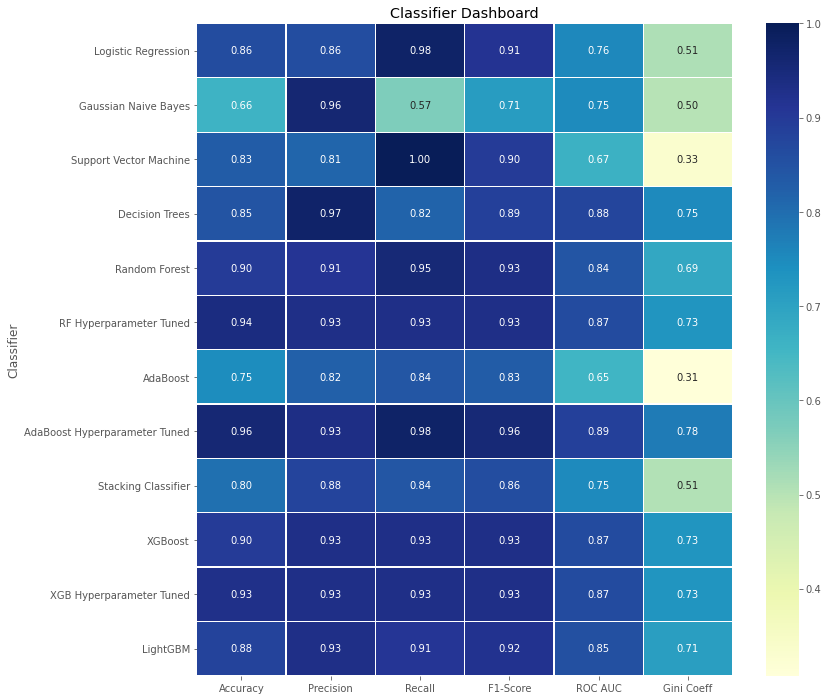

In [113]:
plt.figure(figsize=(12,12))
sns.heatmap(model_eval_metrics, annot=True, linewidths = 0.3, fmt='.2f', cmap='YlGnBu').set_title('Classifier Dashboard')
plt.show()

Given dataset is trained and fitted with the following Classifiers:

**Standalone Classifiers:**
  - Logistic Regression
  - Gaussian Naive Bayes
  - Support Vector Machines
  - Decision Tree Classifier

**Ensembles:**
- Meta-Classifier with Logistic Regression, Gaussian Naive Bayes and Support Vector Machines stacked up. 

- Random Forest Classifier (Bagging Ensemble)
- AdaBoost Classifier (Boosting Ensemble with RandomForest as the base estimator)
- XGBoost Classifier (Boosting Ensemble)
- LightGBM Classifier (Boosting Ensemble)

Finally, all the classifier metrics are compared and evaluated using:
- ROC AUC Score
- Precision-Recall AUC Score
- Test Accuracy Score
- F1-Score

**Inference from Classifier Comparison:**
- Given dataset has **Class Imbalance** with classes skewed towards the positive class - mainly because for each patient a total of 6 records are available. This may cause **'Sample Bias'** in the model inherently.
- Given dataset has lot of **multicollinear** features with inherent dependencies. This will impact **'Parametric Methods'** such as Logistic Regression and SVM, in the absence of regularisation. 
- It is observed that both Log-Reg and SVM (default values) have given average results. However, SVM with high regularisation (C=100) has provided a Recall Score of 1.00, though the accuracy score is not the best among the classifiers. 
- Gaussian Naive Bayes is one of the worst performing Classifiers for this dataset mainly because of the inherent dependencies among the predictors, which is against the 'Naive' assumption of Naive Bayes that the predictors are independent.
- Decision Tree Classifier is able to provide better generalised results when compared to the other classifiers, this is mainly because of the **'Non-Parametric'** nature of the algorithm.
- In contrast to the standalone Classifiers, it is observed that the *Ensembles are able to provide better results with this dataset*. 
- Random Forest Classifier, AdaBoost (with Random Forest as Base Estimator), XGBoost and LightGBM have performed excellently in terms of the overall ROC AUC Score and Accuracy. Feature Importance is also plotted for all the tree-based models for model interpretability. 


- From the ROC AUC Curve for all the classifiers, we can infer that,
  - If our objective is to arrest False Positive Rate, then **'XGBoost'** is the preferred model, considering it is the first model to reach a True Positive Rate of 1.00 for a False Negative Rate of 0.30.
  - If our objective is to improve True Positive Rate at the expense of few False Positives, **'AdaBoost'** and **'Random Forest'** classifiers are preferrable as they provide overall higher True Positive Rate score.
  - In addition, Tree-based models have the advantage to get Feature Importance, and also can interpret the model using 'Partial Dependence Plots', 'Waterfall Charts' etc. 
  - If True Positive Rate is the only objective at the expense of Model Interpretability, we can go for extremely regularized 'black-box' models such as **'SVM'** (Radial Basis Kernel at C=100) has provided a Recall score of 1.0 on the test dataset. However, it would be challenging to explain the model interpretability to stakeholders. 


Since the objective of this entire exercise is to build a model that will predict Parkinsons's which will be subsequently used as a preliminary alert check for the patient to book a doctor's appointment, False Positives will not have much impact on the results (doctor's appointment will resolve it in next steps), However, we are more interested in **reducing the False Negatives**, therefore we go for models that provide higher True Positive Rate (Recall score = TP/(TP+FN)). Hence, **'AdaBoost with Random Forest as Base Estimator'** and **'XGBoost'** models are recommended here with the thresholds set using ROC AUC & Precision-Recall Curve. 

